## Rasterio

Rasterio é um módulo altamente útil para processamento raster que você pode usar para ler e escrever vários formatos raster diferentes em Python. O Rasterio é baseado no GDAL e o Python registra automaticamente todos os drivers GDAL conhecidos para ler os formatos suportados ao importar o módulo. Os formatos de arquivo mais comuns incluem, por exemplo, arquivos TIFF e GeoTIFF, ASCII Grid e Erdas Imagine .img.

Antes do Rasterio, havia uma opção Python para acessar os vários tipos diferentes de arquivos de dados raster usados no campo GIS: as ligações Python distribuídas com a Geospatial Data Abstraction Library, GDAL. Essas ligações estendem o Python, mas fornecem pouca abstração para a API C do GDAL. Isso significa que os programas Python que os utilizam tendem a ser lidos e executados como programas C. Por exemplo, as ligações Python do GDAL exigem que os usuários fiquem atentos a ponteiros C pendurados, possíveis travamentos de programas. Isso é ruim: entre outras considerações, escolhemos Python em vez de C para evitar problemas com ponteiros.

Como seria ter uma abstração de dados geoespaciais na biblioteca padrão do Python? Um que usou recursos e expressões idiomáticas modernas da linguagem Python? Um que liberou os usuários da preocupação com ponteiros pendurados e outras armadilhas da programação C? O objetivo do Rasterio é ser esse tipo de biblioteca de dados raster – expressando o modelo de dados do GDAL usando menos classes de extensão não idiomáticas e tipos e protocolos Python mais idiomáticos, enquanto executa tão rápido quanto as ligações Python do GDAL.

###Primeiros passos com Rasterio

Vamos começar a usar o rasterio. Precisamos instalar o rasterio no ambiente de execução do Google Colab:

In [ ]:
!pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 39.5 MB/s eta 0:00:00


Depois de instalado, importaremos o pacote:

In [ ]:
import rasterio
import pandas as pd
import numpy as np
import os

Usaremos a imagem anexada salva no Google Drive para análise. Primeiro autenticamos e montamos o Drive para que o Colab possa acessar os arquivos.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Definimos o caminho de nossa imagem no Google Drive para a variável "caminho"

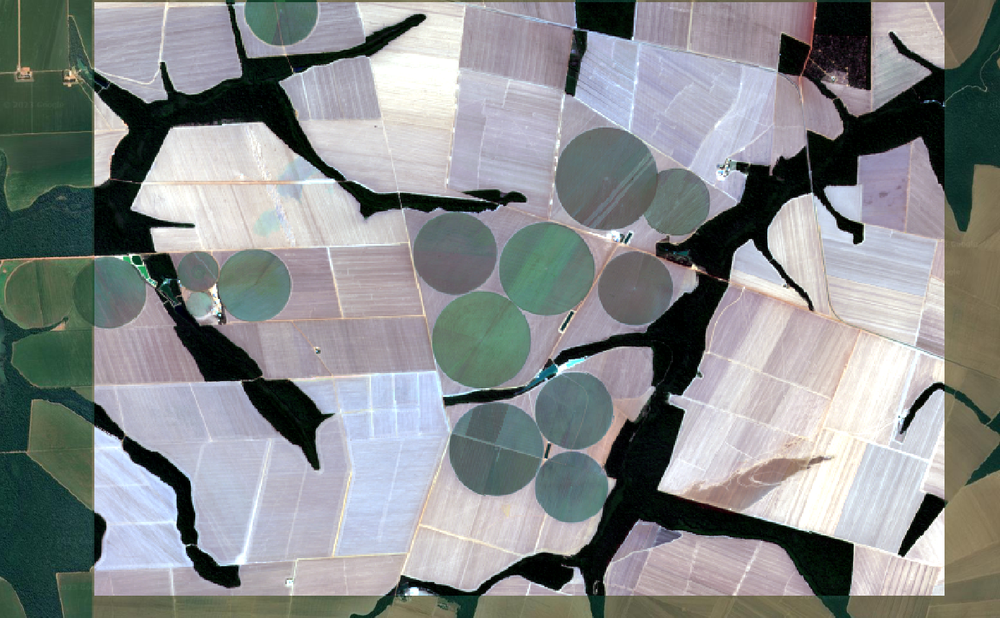

Link: https://drive.google.com/drive/folders/1-q1QN4m8JvPaEY5PrYMbswc9RQEDYY1b?usp=sharing

In [ ]:
path = '/content/drive/MyDrive/Datasets_AG/AOI_AG_SOJA/AOI_AGRICULTURA.tif'

Temos duas maneiras de acessar nossa imagem por meio da biblioteca raster. O primeiro usará a expressão "with rasterio.open (path) as src:" onde dentro deste bloco o arquivo será aberto para leitura, porém quando o bloco de comando for finalizado, o arquivo será fechado.

In [ ]:
with rasterio.open(path) as src:
    S2 = src.read()

print(src.name)
print(src.mode)
print(src.closed)

/content/drive/MyDrive/Datasets_AG/AOI_AG_SOJA/AOI_AGRICULTURA.tif
r
True


A segunda maneira é mais simples, usando "src2 = rasterio.open (path)", onde a variável "src2" armazena o arquivo. Observe que o arquivo permanece aberto enquanto a variável "src2" não for apagada da memória.

In [ ]:
src2 = rasterio.open(path)
print(src2.name)
print(src2.mode)
print(src2.closed)

/content/drive/MyDrive/Datasets_AG/AOI_AG_SOJA/AOI_AGRICULTURA.tif
r
False


A principal vantagem da primeira forma é ao utilizar imagens grandes, ou várias imagens, pois o arquivo ficará apenas aberto, ocupando a memória durante aquele bloco específico.

Continuaremos usando da maneira mais simples, sem nos preocupar com o uso de memória. Usaremos algumas funções para exibir o total de linhas, colunas e bandas ou canais.

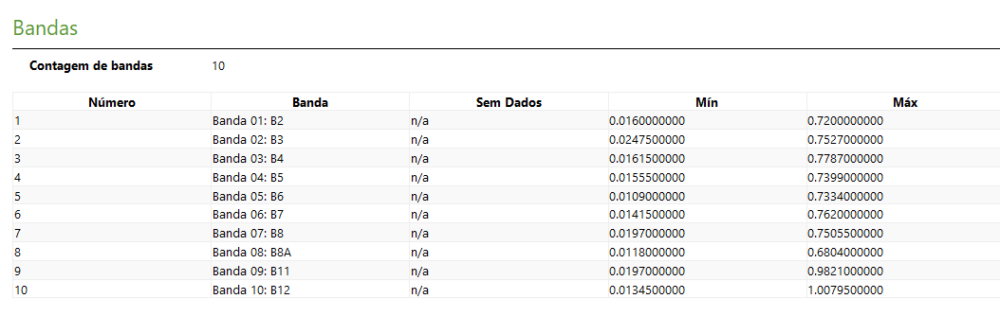

In [ ]:
print(src2.width)
print(src2.height)
print(src2.count)

685
478
10


In [ ]:
src2.read()

array([[[0.09565, 0.09295, 0.0928 , ..., 0.07645, 0.07725, 0.0776 ],
        [0.09225, 0.093  , 0.09295, ..., 0.0774 , 0.0776 , 0.0774 ],
        [0.09625, 0.09595, 0.0954 , ..., 0.0775 , 0.0763 , 0.0783 ],
        ...,
        [0.08275, 0.0852 , 0.08275, ..., 0.0983 , 0.09795, 0.101  ],
        [0.0823 , 0.08215, 0.08115, ..., 0.09845, 0.1009 , 0.10065],
        [0.08455, 0.0833 , 0.0822 , ..., 0.10135, 0.1037 , 0.10105]],

       [[0.14135, 0.13855, 0.13695, ..., 0.10675, 0.10715, 0.10795],
        [0.13645, 0.13745, 0.1378 , ..., 0.10645, 0.10755, 0.1071 ],
        [0.14195, 0.14315, 0.1415 , ..., 0.10585, 0.10565, 0.1057 ],
        ...,
        [0.11295, 0.1142 , 0.11185, ..., 0.14245, 0.1412 , 0.1442 ],
        [0.11145, 0.1112 , 0.11045, ..., 0.14225, 0.1431 , 0.14435],
        [0.1134 , 0.11315, 0.1101 , ..., 0.14285, 0.1461 , 0.14535]],

       [[0.2193 , 0.2148 , 0.2147 , ..., 0.16495, 0.166  , 0.1659 ],
        [0.2141 , 0.2158 , 0.21685, ..., 0.1651 , 0.1655 , 0.1647 ],
    

A imagem usada no estudo é uma imagem Sentinel 2 obtida por meio do Google Earth Engine. 10 bandas e 4 índices espectrais foram selecionados. Eles são:
Azul, Verde, Vermelho, Red-edge1, Red-edge2, Red-edge3, NIR, NIR-Red-edge, SWIR1, SWIR2, NDVI, EVI, SAVI e NDWI.

Para identificar que tipo de dado está em cada banda, usaremos uma lista de compreensão para obter um dicionário com o número da banda e o respectivo tipo:

In [ ]:
{i: dtype for i, dtype in zip(src2.indexes, src2.dtypes)}

{1: 'float64',
 2: 'float64',
 3: 'float64',
 4: 'float64',
 5: 'float64',
 6: 'float64',
 7: 'float64',
 8: 'float64',
 9: 'float64',
 10: 'float64'}

Em seguida, vamos dar uma olhada nos valores que são armazenados na banda. Como os valores das bandas são armazenados como matrizes numpy, é extremamente fácil calcular estatísticas básicas usando funções numpy básicas.

In [ ]:
array = src2.read()
stats = []
for band in array:
    stats.append({
        'min': band.min(),
        'mean': band.mean(),
        'median': np.median(band),
        'max': band.max()})

In [ ]:
pd.DataFrame.from_dict(stats)

,min,mean,median,max
0,0.01600,0.073791,0.08160,0.72000
1,0.02475,0.104800,0.11325,0.75270
2,0.01615,0.148927,0.17035,0.77870
3,0.01555,0.185403,0.20090,0.73990
4,0.01090,0.236767,0.23650,0.73340
5,0.01415,0.268118,0.26600,0.76200
6,0.01970,0.284701,0.28300,0.75055
7,0.01180,0.304761,0.30190,0.68040
8,0.01970,0.386497,0.44780,0.98210
9,0.01345,0.268567,0.32085,1.00795


Também podemos acessar metadados de imagem para obter informações úteis, como crs, limites e transformação:

In [ ]:
print(src2.meta)

{'driver': 'GTiff', 'dtype': 'float64', 'nodata': None, 'width': 685, 'height': 478, 'count': 10, 'crs': CRS.from_epsg(4326), 'transform': Affine(0.0001796630568239043, 0.0, -55.81664051570964,
       0.0, -0.0001796630568239043, -12.086832147828162)}


In [ ]:
print(src2.bounds)
print(src2.crs)
print(src2.transform)

BoundingBox(left=-55.81664051570964, bottom=-12.172711088989988, right=-55.69357132178527, top=-12.086832147828162)
EPSG:4326
| 0.00, 0.00,-55.82|
| 0.00,-0.00,-12.09|
| 0.00, 0.00, 1.00|


Finalmente, vamos usar a função read () para abrir os valores de pixel do nosso arquivo como um array numpy.

In [ ]:
array = src2.read()

Verificando o tipo da variável:

In [ ]:
type(array)

numpy.ndarray

Portanto, também podemos verificar a forma da matriz de valor:

In [ ]:
array.shape

(10, 478, 685)

Observe aqui que o raster importa a imagem como uma matriz onde a primeira dimensão são as bandas ou canais, a segunda são as linhas e a terceira são as colunas. (Bandas, linhas, colunas).

Se quisermos ler apenas uma das bandas de nossa imagem, podemos passar como parâmetros na função read () o índice da banda escolhida:

In [ ]:
band1 = src2.read(1)

Portanto, só temos a primeira banda (1). Verificamos como ficará a forma desta matriz:

In [ ]:
band1.shape

(478, 685)

Vamos importar o matplotlib e mostrar a função do rasterio para plotar nossas imagens:

In [ ]:
from rasterio.plot import show
from matplotlib import pyplot as plt
import numpy as np

Primeiro vamos representar graficamente a variável band1:

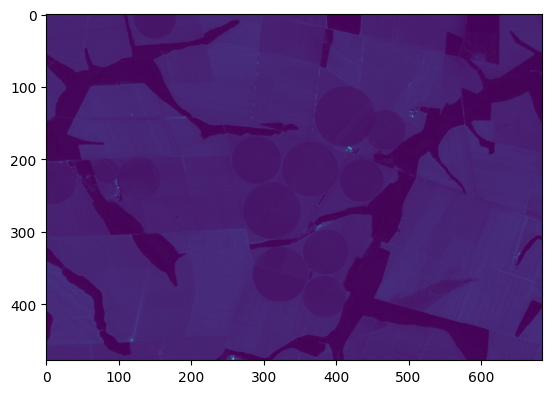

<Axes: >

In [ ]:
show(band1)

Agora usaremos algumas funções de matplotlib para plotar as 3 primeiras bandas de nossa imagem:

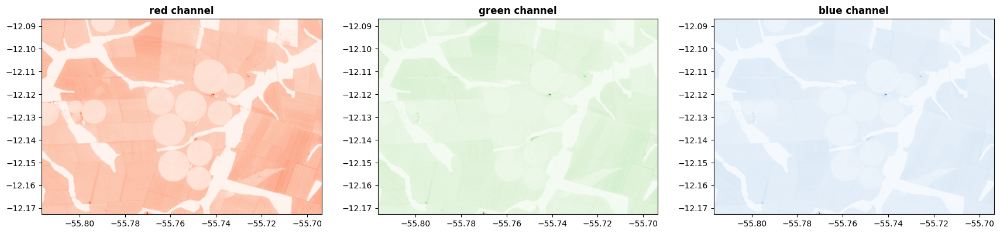

In [ ]:
fig, (axr, axg, axb) = plt.subplots(1,3, figsize=(21,7))
show((src2, 3), ax=axr, cmap='Reds', title='red channel')
show((src2, 2), ax=axg, cmap='Greens', title='green channel')
show((src2, 1), ax=axb, cmap='Blues', title='blue channel')
plt.show()

Vamos importar as bandas azuis, vermelhas e verdes separadas:

In [ ]:
red = src2.read(3)
green = src2.read(2)
blue = src2.read(1)

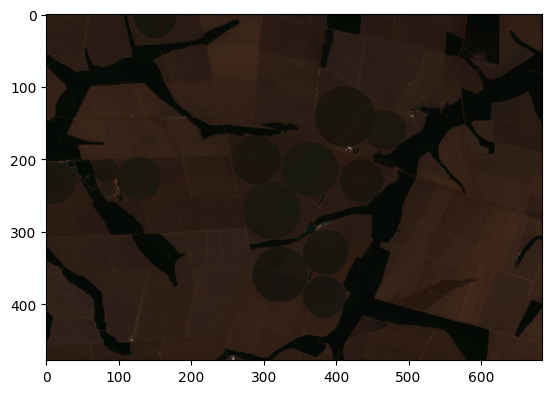

In [ ]:
rgb = np.dstack((red, green, blue))
plt.imshow(rgb)

### Histograma usando Rasterio

Um histograma nos mostra como os dados são distribuídos. Cada compartimento ou barra no gráfico representa o número ou frequência de pixels que se enquadram no intervalo especificado pelo compartimento.

Você pode usar o argumento bins = para especificar menos ou mais quebras em seu histograma. Observe que este argumento não resulta no número exato de quebras que você deseja em seu histograma.

In [ ]:
from rasterio.plot import show_hist

In [ ]:
src2.count

10

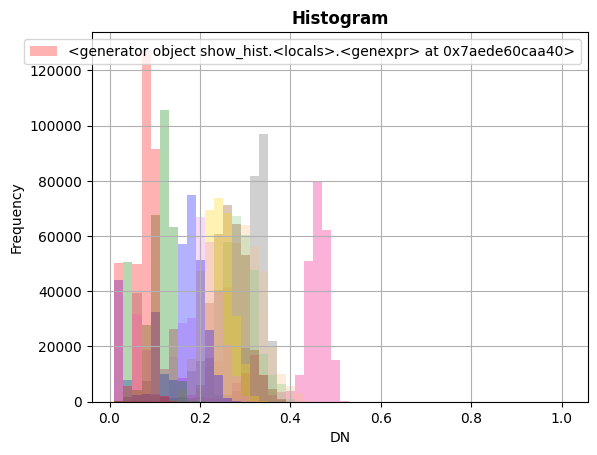

In [ ]:
show_hist(src2, bins=50, lw=0.0, stacked=False, alpha=0.3,
      histtype='stepfilled', title="Histogram")

### Indices Espectrais de Vegetação

Os índices de vegetação são modelos matemáticos que vêm sendo desenvolvidos com base na reflectância das coberturas vegetais.

Ao integrar a reflectância de duas ou mais bandas espectrais, ou comprimentos de ondas, os índices de vegetação conseguem realçar determinadas características.

Para o cálculo dos índices de vegetação é comum a utilização da reflectância das assinaturas espectrais.

Quando conhecemos as interações entre a REM e as plantas nos diferentes comprimentos de onda, podemos desenvolver e utilizar inúmeros índices de vegetação.

Tais índices de vegetação podem ser utilizados para a determinação de uma gama de parâmetros biofísicos e características da vegetação.

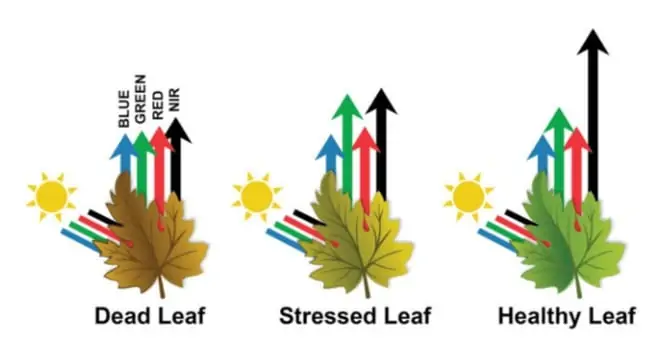

O  índice  de área  foliar, a biomassa, a porcentagem de cobertura do solo, a atividade fotossintética, deficiências hídricas e até mesmo estimativas de produtividade são alguns desses parâmetros.

O sensoriamento remoto fornece a base para o desenvolvimento dos índices de vegetação, a reflectância das culturas.

As principais vantagens da utilização dos índices de vegetação estão na eficiência, rapidez e praticidade das mensurações.

Ao contrário dos monitoramentos convencionais, essas técnicas permitem a identificação de variabilidade nas lavouras durante seu desenvolvimento.

#### Principais índices de vegetação

Apesar de hoje em dia os índices de vegetação estarem crescendo no mercado, seu  conceito data da década de 70. São inúmeros índices de vegetação existentes como o NDVI, EVI, SAVI e VARI.

Cada um apresenta uma finalidade e funcionalidade diferente e são usados mundialmente, não apenas na avaliação de lavouras.

***Índice de Vegetação por Diferença Normalizada (NDVI)***

O NDVI é a sigla em inglês para Normalized Difference Vegetation Index e trata-se do índice mais conhecido no mercado.

Esse índice de vegetação atua com sensores infravermelho próximo (NIR), analisando a resposta espectral das plantas nas bandas do vermelho e do infravermelho próximo.

O índice de vegetação NDVI pode ser utilizado no monitoramento das lavouras para detecção de déficit hídrico, danos de pragas, estimativa de produtividade e outros.

O cálculo do índice de vegetação NDVI é feito através da fórmula:


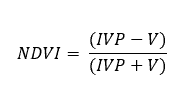

Onde, IVP é reflectância no faixa do Infravermelho próximo e V é a reflectância na faixa do vermelho e seus valores variam de -1 a 1.

Portanto, valores próximos de 1 indicam uma vegetação ativa e saudável, enquanto próximos de 0 ou negativos outros objetos ou vegetação menos ativa ou senescente.

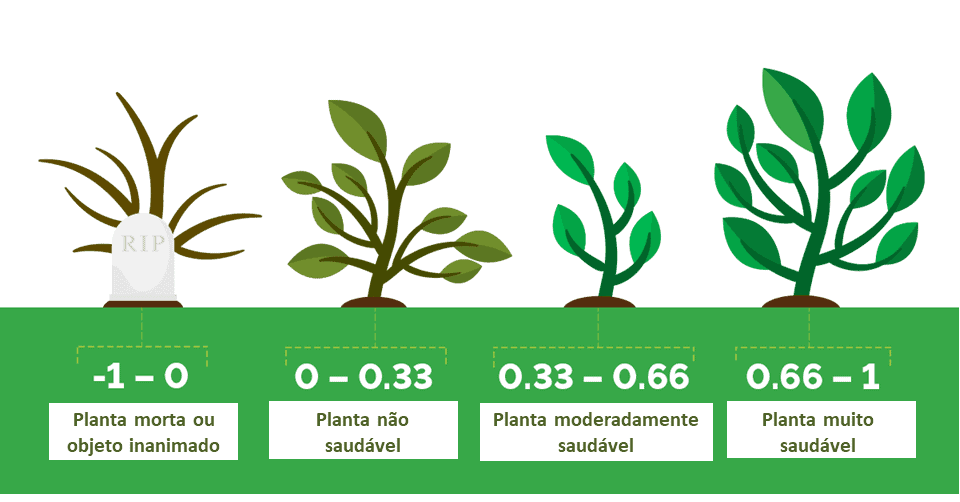

Vamos usar a imagem de satelite anterior para gerar os indices espectrais. De acordo com a posição de cada banda, vamos criar uma variável para cada e realizar a matemática de bandas para encontrar os indices:

In [ ]:
blue = src2.read(1)   #B2
green = src2.read(2)  #B3
red = src2.read(3)    #B4
re1 = src2.read(4)    #B5
re2 = src2.read(5)    #B6
re3 = src2.read(6)    #B7
nir = src2.read(7)    #B8
re4 = src2.read(8)    #B8A
swir1 = src2.read(9)  #B11
swir2 = src2.read(10) #B12

In [ ]:
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

Começamos pelo NDVI:

In [ ]:
ndvi = (nir.astype(float) - red.astype(float)) / (nir + red)

Vamos obter as coordenadas envolvente da imagem para adicionar ao plot.

In [ ]:
bounds  = src2.bounds
Xmin = bounds[0]
Ymin = bounds[1]
Xmax = bounds[2]
Ymax = bounds[3]
extends = (Xmin, Xmax, Ymin, Ymax)

E vamos plotar com um mapa de cores e uma legenda:

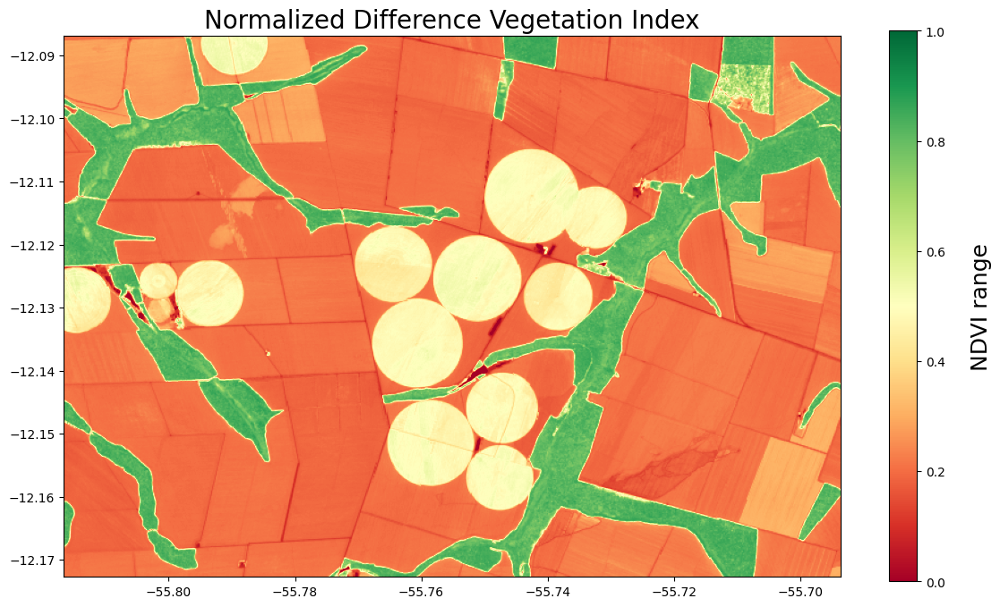

In [ ]:
plt.figure(figsize=[14,8])
plt.imshow(ndvi, extent=extends, cmap='RdYlGn', vmin=0, vmax=1)
plt.title('Normalized Difference Vegetation Index',fontsize = 20)
cbar = plt.colorbar()
cbar.set_label('NDVI range',rotation=90,labelpad=20,fontsize = 18)

***Índice de Vegetação Melhorado (EVI)***

O índice de vegetação melhorado é calculado de forma similar ao NDVI, apresentando algumas modificações que garantem a correção de luz refletida.

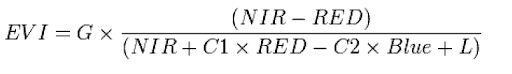

Onde:

NIR = Reflectância do infravermelho próximo;

RED = Reflectância do vermelho;

BLUE = Reflectância do azul;

L = ajuste de fundo;

C1 e C2 = Coeficientes de resistência a aerossóis.

É comum que partículas em suspensão na atmosfera e sinais de fundo do dossel (cobertura do solo) levem à formação de reflexos indesejáveis.

Esses reflexos prejudicam a captura e consequentemente a interpretação dos dados.

Os dados produzidos pelo índice de vegetação melhorado não saturam tão facilmente quanto os do NDVI.

O EVI é destinado especialmente em regiões que concentram grandes quantidades de biomassa vegetal (elevados teores de clorofila) como as florestas tropicais.

Vamos aplicar o calculo do indice evi e observar os valores máximo, minímo e médio da imagem.

In [ ]:
evi = 2.5 * ((nir - red) / (nir + (6 *red - 7.5 * blue + 1)))

In [ ]:
evi.mean()

0.22294040981294705

In [ ]:
evi.max()

0.7098066695414691

In [ ]:
evi.min()

-0.17352890223479817

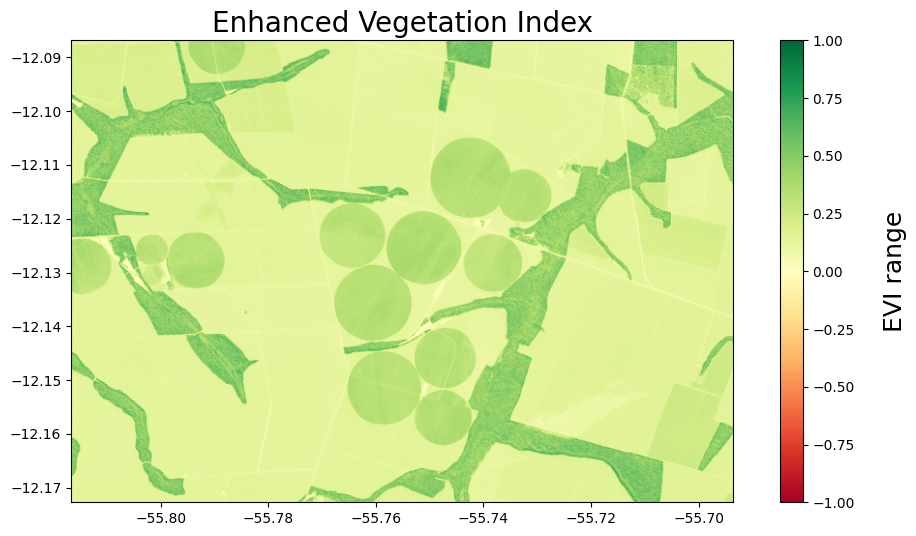

In [ ]:
plt.figure(figsize=[12,6])
plt.imshow(evi, extent=extends, cmap='RdYlGn', vmin=-1, vmax=1)
plt.title('Enhanced Vegetation Index',fontsize = 20)
cbar = plt.colorbar()
cbar.set_label('EVI range',rotation=90,labelpad=20,fontsize = 18)

***Índice de Vegetação Ajustado ao Solo (SAVI)***

Como o próprio nome sugere, o SAVI surgiu da necessidade de atenuar os efeitos causados pelo solo na captura dos dados.

Seu cálculo é realizado pela mesma fórmula do NDVI acrescido da constante L, que varia de acordo o maior ou menor grau de cobertura do solo.

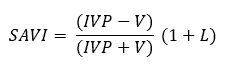

O índice SAVI é muito utilizado em áreas que apresentam baixas densidades de vegetação ou de início de plantio.

In [ ]:
savi = (nir - red) / (nir + red + 0.5) * (1 + 0.5)

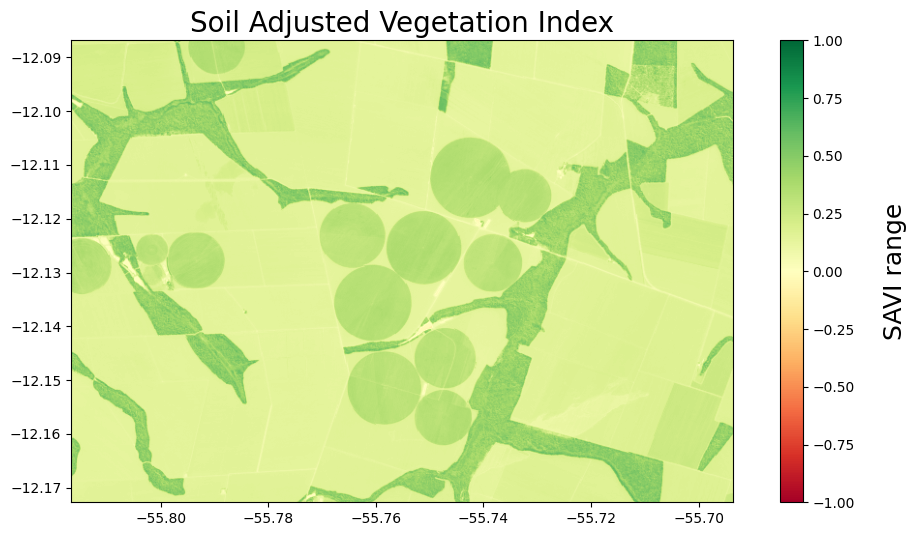

In [ ]:
plt.figure(figsize=[12,6])
plt.imshow(savi, extent=extends, cmap='RdYlGn', vmin=-1, vmax=1)
plt.title('Soil Adjusted Vegetation Index',fontsize = 20)
cbar = plt.colorbar()
cbar.set_label('SAVI range',rotation=90,labelpad=20,fontsize = 18)

Plotamos o histograma do NDVI junto com o SAVI para comparar a distribuiçao de valores:

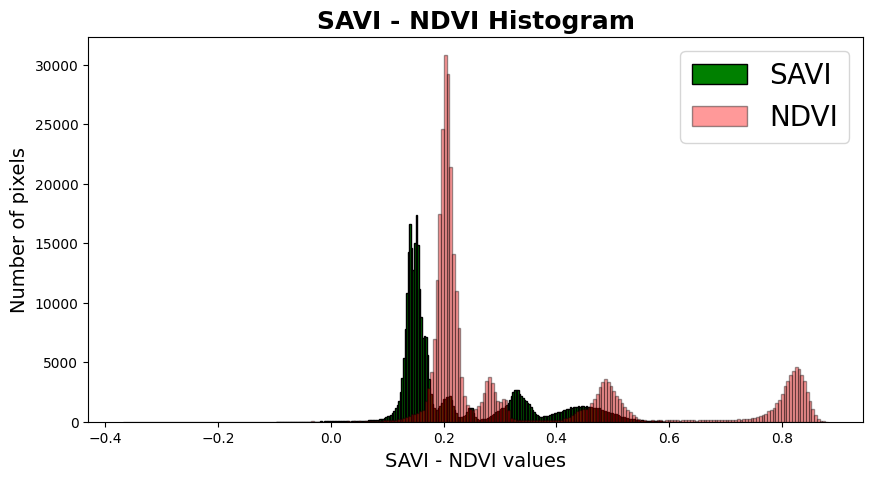

In [ ]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
plt.title("SAVI - NDVI Histogram", fontsize=18, fontweight='bold')
plt.xlabel("SAVI - NDVI values", fontsize=14)
plt.ylabel("Number of pixels", fontsize=14)

x = savi[~np.isnan(savi)]
color = 'g'

ax.hist(x,bins=255,color=color,histtype='bar', ec='black')

z = ndvi[~np.isnan(ndvi)]
color = 'r'
ax.hist(z,bins=255,color=color,histtype='bar', ec='black', alpha=0.4)
ax.legend(['SAVI', 'NDVI'], fontsize=20)


plt.show()

***Índice Resistente à Atmosfera na Região Visível (VARI)***

O índice de vegetação VARI, assim como o EVI, foi designado para realizar correções dos efeitos atmosféricos.

O VARI é destinado principalmente para detecção de áreas de estresse nas lavouras e analisa o nível de ‘verde’ capturado dos dados (ou imagens).

Diferente dos índices de vegetação anteriores, que são baseados em sensores infravermelho próximo (NIR), as imagens VARI são geradas pelos sensores RGB.

A tendência de uso de imagens RGB não busca a substituição da tecnologia NDVI, mas sim a ampliação das técnicas de mensuração.

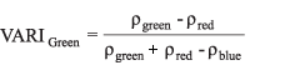

In [ ]:
vari = (green - red) / (green + red - blue)

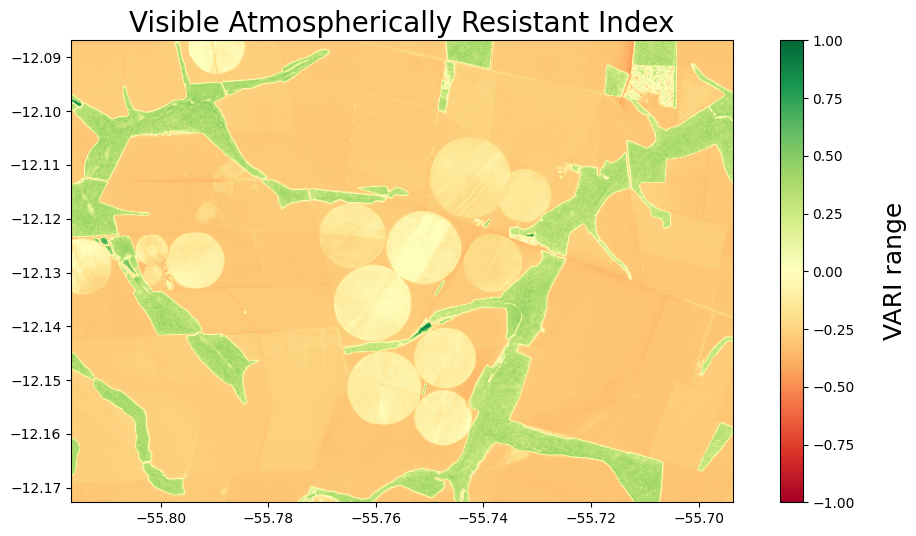

In [ ]:
plt.figure(figsize=[12,6])
plt.imshow(vari, extent=extends, cmap='RdYlGn', vmin=-1, vmax=1)
plt.title('Visible Atmospherically Resistant Index',fontsize = 20)
cbar = plt.colorbar()
cbar.set_label('VARI range',rotation=90,labelpad=20,fontsize = 18)

***Índice de RedEdge por Diferença Normalizada (NDRE)***

O NDRE é um índice para avaliar o teor de clorofila nas plantas, assim como sua captação de nitrogênio e demanda de fertilizantes, sendo capaz de fornecer uma melhor análise de estádios fenológicos mais avançados, pois consegue obter dados em profundidade maiores.

Esse índice utiliza a banda NIR e RED EDGE (borda do vermelho).

A máxima absorção da clorofila se dá nas ondas vermelhas, sendo assim, a radiação vermelha não penetra muito além de algumas camadas de folhas, especialmente de plantas com elevada produção de folhas e biomassa.

Por outro lado, a radiação na borda do vermelho pode penetrar na camada de folhas de forma muito mais profunda em relação à luz vermelha.

Assim, uma faixa de onda da borda do vermelho será mais sensível a níveis médios e altos de clorofila e biomassa, portanto, detectando com maior sensibilidade o N foliar.

Além disso, O NDRE pode detectar problemas de ataque de doenças abaixo do dossel das plantas.

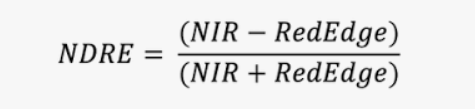

In [ ]:
ndre = (nir - re1) / (nir + re1)

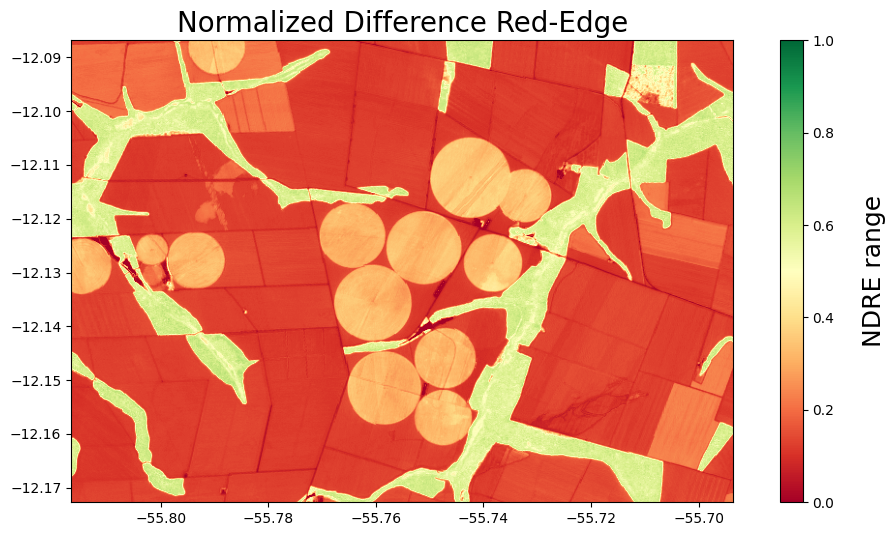

In [ ]:
plt.figure(figsize=[12,6])
plt.imshow(ndre, extent=extends, cmap='RdYlGn', vmin=0, vmax=1)
plt.title('Normalized Difference Red-Edge',fontsize = 20)
cbar = plt.colorbar()
cbar.set_label('NDRE range',rotation=90,labelpad=20,fontsize = 18)

***Índice De Água Por Diferença Normalizada (NDWI)***

 Esse índice é sensível a mudanças no conteúdo de água no dossel da vegetação através da utilização das propriedades de absorção de energia pela água na faixa dos 1241 nm. Da mesma forma que o anterior, ele usa uma medição de referencia numa banda pouco responsiva à quantidade de água na planta, porém é um índice normalizado assim como o NDVI e NDRE.

 O NDWI é usado para monitorar mudanças relacionadas ao conteúdo de água em corpos d'água. Como os corpos d'água absorvem fortemente a luz no espectro eletromagnético do visível ao infravermelho, o NDWI usa bandas de infravermelho próximo e verde para destacar os corpos d'água. É sensível a terrenos construídos e pode resultar em superestimação de corpos d'água. O índice foi proposto por McFeeters, 1996.

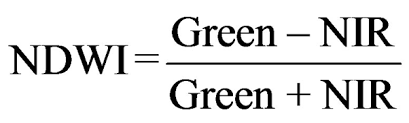

In [ ]:
ndwi = (green - nir) / (green + nir)

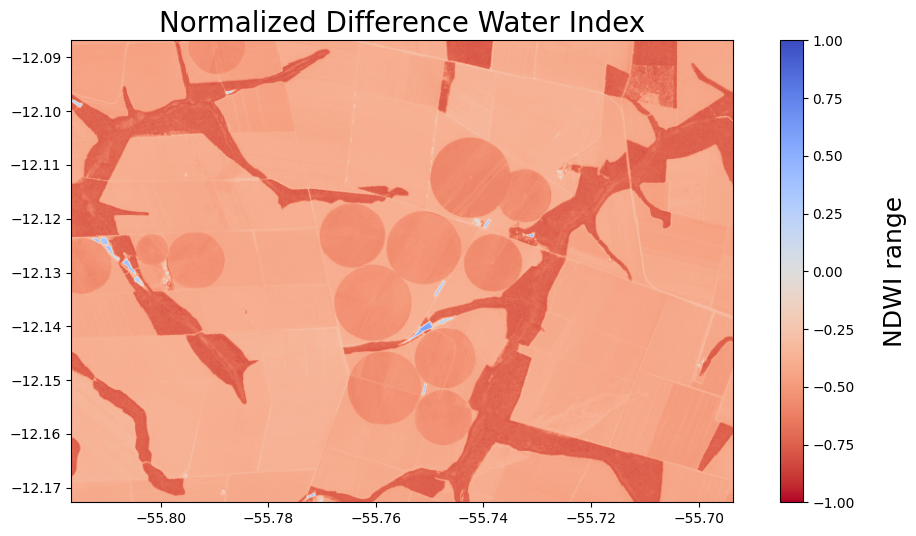

In [ ]:
plt.figure(figsize=[12,6])
plt.imshow(ndwi, extent=extends, cmap='coolwarm_r', vmin=-1, vmax=1)
plt.title('Normalized Difference Water Index',fontsize = 20)
cbar = plt.colorbar()
cbar.set_label('NDWI range',rotation=90,labelpad=20,fontsize = 18)

***Índice de Vegetação por Diferença Normalizada com banda Verde (GNDVI)***

O GNDVI é similar ao NDVI, mas utiliza a faixa verde do espectro e não a vermelha, com uma medição entre 540 e 570 nm. Essa modificação faz com que esse índice seja mais sensível à concentração de clorofila das plantas do que o NDVI.

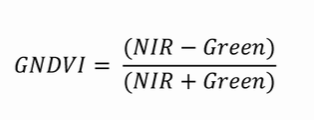

 O índice GDVI, a versão não normalizada do GNDVI, foi utilizado também com a proposta de prever doses ideais de nitrogênio para a cultura de milho nos estudos de Sripada, R., et al (2005).

In [ ]:
gndvi = (nir - green) / (nir + green)

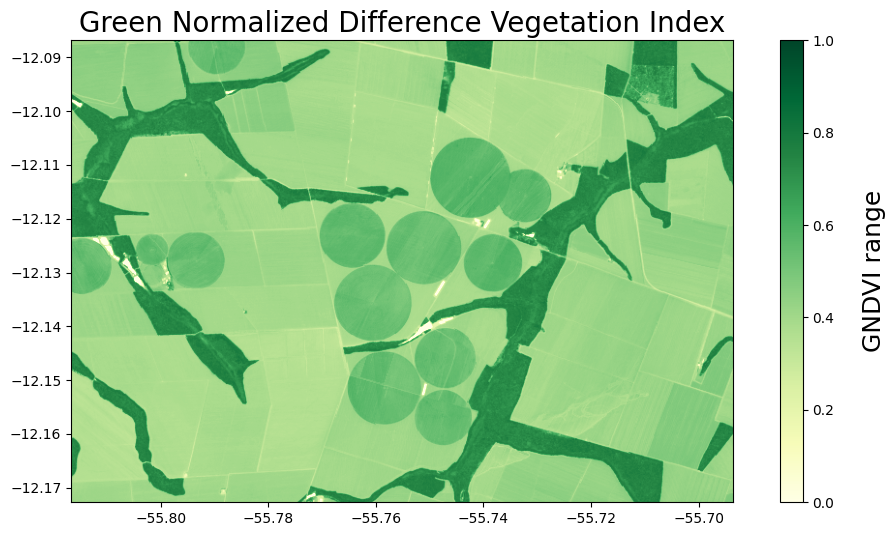

In [ ]:
plt.figure(figsize=[12,6])
plt.imshow(gndvi, extent=extends, cmap='YlGn', vmin=0, vmax=1)
plt.title('Green Normalized Difference Vegetation Index',fontsize = 20)
cbar = plt.colorbar()
cbar.set_label('GNDVI range',rotation=90,labelpad=20,fontsize = 18)

***Índice de Área Foliar (LAI)***

O LAI é utilizado para estimar a cobertura foliar da vegetação e também em estimativas de crescimento vegetativo e produtividade. Conforme pode ser visto na equação (abaixo), esse índice é uma variação do já citado Índice de Vegetação Aprimorado (EVI). Os valores desse índice usualmente variam de 0 a aproximadamente 3,5.

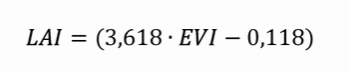

In [ ]:
lai = (3.618*evi) - 0.118

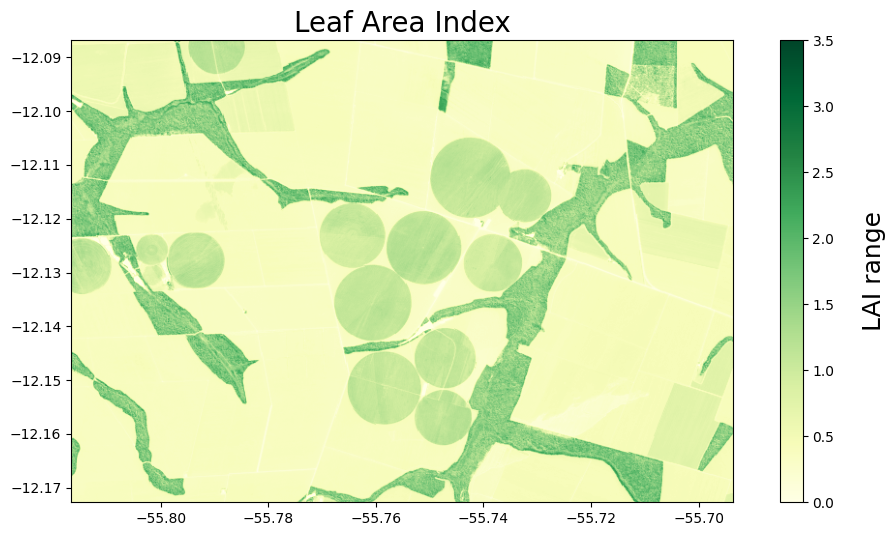

In [ ]:
plt.figure(figsize=[12,6])
plt.imshow(lai, extent=extends, cmap='YlGn', vmin=0, vmax=3.5)
plt.title('Leaf Area Index',fontsize = 20)
cbar = plt.colorbar()
cbar.set_label('LAI range',rotation=90,labelpad=20,fontsize = 18)

#### Reclassify NDVI

Vamos agora categorizar (ou classificar) os resultados do NDVI em classes úteis. Valores abaixo de 0 serão classificados conjuntamente como sem vegetação. Classes adicionais serão criadas para área nua e áreas de vegetação baixa, moderada e alta.

Primeiro iniciamos instalando e importando a biblioteca earthpy

In [ ]:
!pip install earthpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 6.5 MB/s eta 0:00:00


In [ ]:
import earthpy.plot as ep

Reclassificamos os valores em determinados intervalos.

In [ ]:
ndvi_class_bins = [0, 0.3, 0.5, 0.7]
ndvi_classified = np.digitize(ndvi, ndvi_class_bins)

In [ ]:
np.unique(ndvi_classified)

array([0, 1, 2, 3, 4])

Informamos os labels de cada intervalo e plotamos a imagem com a legenda:

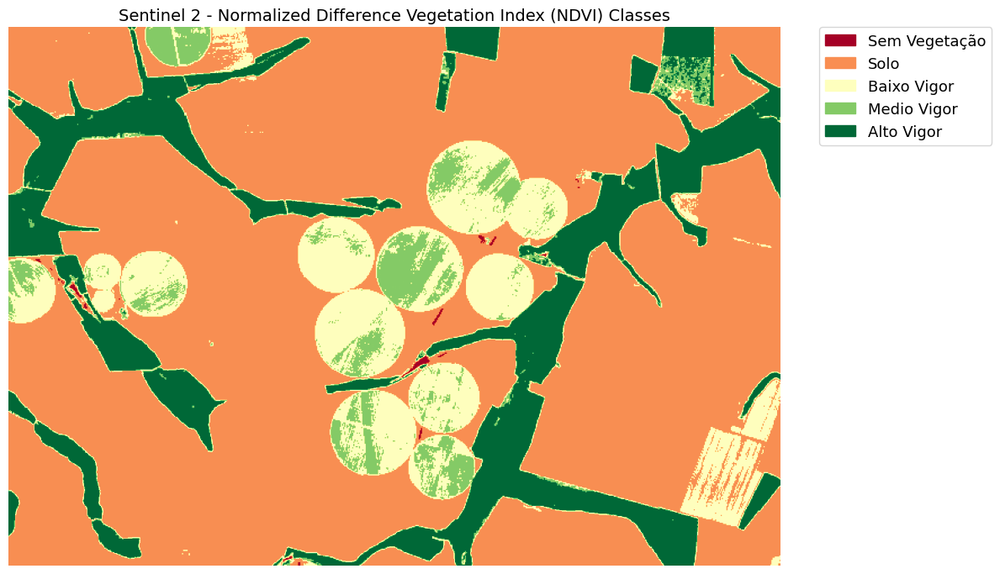

In [ ]:
ndvi_cat_names = [
    "Sem Vegetação",
    "Solo",
    "Baixo Vigor",
    "Medio Vigor",
    "Alto Vigor",
]

classes = np.unique(ndvi_classified)
classes = classes.tolist()
fig, ax = plt.subplots(figsize=(12, 12))
im = ax.imshow(ndvi_classified, cmap='RdYlGn')

ep.draw_legend(im_ax=im, classes=classes, titles=ndvi_cat_names)
ax.set_title(
    "Sentinel 2 - Normalized Difference Vegetation Index (NDVI) Classes",
    fontsize=14,
)
ax.set_axis_off()
plt.tight_layout()

### Salvando arquivos em formato .TIF

Agora vamos salvar a imagem NDVI em um arquivo com formato .tif, usando os metadados da imagem original.

In [ ]:
profile = src2.profile

Atualizamos a informação da quantidade de bandas da imagem e o tipo de dados.

In [ ]:
profile.update(
    dtype=rasterio.float32,
    count=1,
    compress='lzw')

Por fim salvamos no caminho que escolhemos.

In [ ]:
with rasterio.open('NDVI.tif', 'w', **profile) as dst:
    dst.write(ndvi, 1)

É possível também salvar a imagem reclassificada de NDVI:

In [ ]:
ndvi_classified.dtype

dtype('int64')

In [ ]:
profile2 = src2.profile

A diferença aqui é que salvamos como uma imagem do tipo uint8:

In [ ]:
profile2.update(
    dtype=rasterio.uint8,
    count=1,
    compress='lzw')

In [ ]:
with rasterio.open('NDVI_classify.tif', 'w', **profile2) as dst:
    dst.write(ndvi_classified.astype('uint8'), 1)

Vamos agora criar uma composição com os indices espectrais e salvá-los em um unico arquivo:

In [ ]:
composite = np.stack((ndvi,evi,savi,lai,ndre,gndvi))

In [ ]:
profile3 = src2.profile

In [ ]:
profile3.update(
    dtype=rasterio.float32,
    count=len(composite),
    compress='lzw')

In [ ]:
with rasterio.open('Spectral_indexes.tif', 'w', **profile3) as dst:
    dst.write(composite)

### Resampling com o Rasterio

A reamostragem refere-se à alteração dos valores das células devido a alterações na grade de células raster. Isso pode ocorrer durante a reprojeção. Mesmo se a projeção não estiver mudando, podemos querer mudar o tamanho efetivo da célula de um conjunto de dados existente.

Upsampling refere-se a casos em que estamos convertendo para células de resolução mais alta / menores. Reduzir a resolução é reamostrar para resolução inferior / tamanhos de células maiores.

Ao ler de uma fonte raster em uma matriz de saída de tamanho diferente ou ao especificar um out_shape de tamanho diferente, você está efetivamente reamostrando os dados.

Quando você vai de um tamanho de célula de 5 metros para um tamanho de célula de 10 metros, o tamanho da célula será diferente na grade raster de saída. Ao converter dados raster entre diferentes sistemas de coordenadas, os centros das células não combinam.

Em ambas as situações, uma abordagem de reamostragem deve ser adotada para especificar como a grade de saída tomará forma. Mas nem sempre é uma escolha fácil qual método de reamostragem usar porque há mais de uma maneira de recalcular os valores das células.

Vamos destacar qual técnica de reamostragem é apropriada para uso em determinados cenários. Também falaremos sobre como usamos esses métodos de reamostragem em um ambiente GIS. Existem quatro maneiras comuns de reamostrar grades raster no GIS.

- Nearest Neighbor

- Bilinear

- Cubic Convolution

- Majority

## Nearest Neighbor

A técnica do vizinho mais próximo não altera nenhum dos valores do conjunto de dados raster de entrada. Leva o centro da célula do conjunto de dados raster de entrada para determinar o centro da célula mais próximo do raster de saída. Para velocidade de processamento, geralmente é o mais rápido devido à sua simplicidade.

Como a reamostragem do vizinho mais próximo não altera nenhum valor no conjunto de dados raster de saída, é ideal para dados categóricos, nominais e ordinais.

Quando você deve usar a reamostragem do vizinho mais próximo?
Freqüentemente, você usa o vizinho mais próximo para dados discretos, como classificação de cobertura do solo, edifícios e tipos de solo que têm limites distintos e seus limites são discretos.
Ao reamostrar este tipo de dados, você deve usar a reamostragem do vizinho mais próximo. Por exemplo, se você tiver uma grade raster de classificação de cobertura do solo, o vizinho mais próximo assumirá o valor do centro da célula.

Se a agricultura tem um valor discreto de 7, o método do vizinho mais próximo nunca atribuirá a ela um valor de 7,2. Envolve simplesmente obter o valor de saída do centro de célula da camada de entrada mais próximo.

## Bilinear

A interpolação bilinear é uma técnica para calcular os valores de uma localização de grade com base em quatro células de grade próximas. Ele atribui o valor da célula de saída tomando a média ponderada das quatro células vizinhas em uma imagem para gerar novos valores.

Ele suaviza a grade raster de saída, mas não tanto quanto a convolução cúbica. É útil ao trabalhar com conjuntos de dados contínuos que não têm limites distintos.

Quando você deve usar a reamostragem bilinear?
Rasters de gradientes de temperatura, modelos digitais de elevação e grades de precipitação anual são exemplos de quando usar interpolação bilinear
Por exemplo, rasters de distância de ruído não têm limites discretos. Nesse caso, esse tipo de dados varia continuamente de célula a célula para formar uma superfície.

## Cubic Convolution

A interpolação de convolução cúbica é semelhante à interpolação bilinear no sentido de que obtém a média das células circundantes. Em vez de usar as quatro células mais próximas, o valor de saída é baseado na média das 16 células mais próximas. Como resultado, o tempo de processamento tende a aumentar para este método.

Este método é geralmente usado para superfícies contínuas onde existe muito ruído. Porque leva mais células vizinhas em comparação com a reamostragem bilinear, é bom para suavizar dados da grade raster de entrada.

Quando você deve usar a interpolação de convolução cúbica?
A convolução cúbica é ideal para rasters barulhentos, como suavizar uma imagem de radar ou um modelo de superfície.
Geralmente, usamos convolução cúbica muito menos do que interpolação bilinear. Em particular, é bom para redução de ruído. Por exemplo, uma imagem de radar de abertura sintética pode se beneficiar da técnica de interpolação de convolução cúbica porque reduz o ruído que é comumente visto no radar.

## Majority

Enquanto a reamostragem do vizinho mais próximo tira o centro da célula dos dados raster de entrada, o algoritmo majoritário usa os valores mais comuns dentro da janela de filtro.

Semelhante ao algoritmo do vizinho mais próximo, esta técnica é comumente usada para dados discretos, como classificação da cobertura da terra e outros tipos de grades raster com limites distintos.

Quando você deve usar a reamostragem majoritária?
Freqüentemente, usamos um filtro majoritário para cobertura do solo, de modo que a classe mais popular permanece no raster de saída.
Por exemplo, se a janela de filtro encontrar 3 células de cobertura de terras agrícolas e 2 células de estradas, o conjunto de dados de saída será classificado como agricultura. Isso ocorre porque a classe de cobertura do solo agrícola é a célula mais popular na janela do filtro. Quando comparado com a reamostragem do vizinho mais próximo, o conjunto de dados resultante frequentemente será mais suave.

Começamos importando as funções necessárias:

In [ ]:
from rasterio.enums import Resampling
from rasterio.plot import show

Aqui, usaremos uma imagem com 14 bandas espectrais, baixada do Google Earth Engine:

https://drive.google.com/drive/folders/1OL6siaqjrSST3ToLAMJuitE7sU5-MiR0?usp=sharing

In [ ]:
path = '/content/drive/MyDrive/Datasets_AG/Mosaic_to_merge/AOI_1.tif'

Vamos abri-lo e representar graficamente a primeira banda espectral:

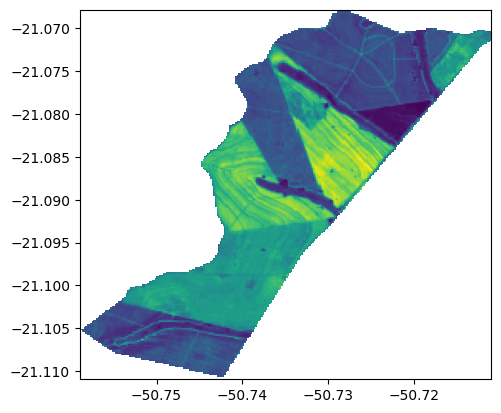

In [ ]:
with rasterio.open(path) as src:
    S2 = src.read()
    show(src)

Verificamos a quantidade de pixels nos eixos x e y da imagem:

In [ ]:
print(S2.shape)

(10, 240, 267)


Vamos definir um fator de aumento em 4x

In [ ]:
upscale_factor = 4

Observe que o rasterio plota a imagem realizando o upscaling, mas a grade de coordenadas não muda. Esta operação não fez com que a imagem perdesse o georreferenciamento de pixels.

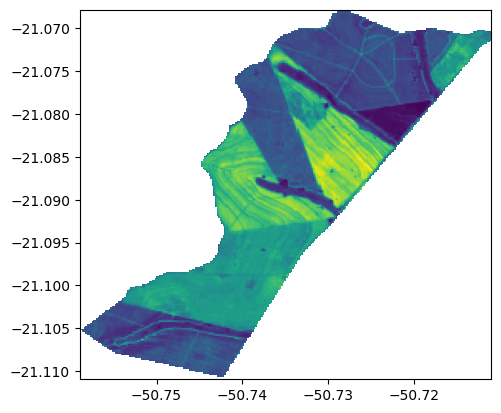

In [ ]:
with rasterio.open(path) as dataset:
  data = dataset.read(out_shape=(dataset.count,int(dataset.height * upscale_factor), int(dataset.width * upscale_factor)),resampling=Resampling.bilinear)
  transform = dataset.transform * dataset.transform.scale((dataset.width / data.shape[-1]),(dataset.height / data.shape[-2]))
  show(dataset,transform=transform)

O tamanho da matriz que representa a imagem é multiplicado pelo fator de escala:

In [ ]:
data.shape

(10, 960, 1068)

In [ ]:
profile = src2.profile.copy()

In [ ]:
profile.update({"height": data.shape[-2],
                    "width": data.shape[-1],
                   "transform": transform})

with rasterio.open("img_resampling.tif", "w", **profile) as dataset:
    dataset.write(data)

### Reprojeção

O Rasterio pode mapear os pixels de um raster de destino com um sistema de referência de coordenadas associado e transformar os pixels de uma imagem de origem com um sistema de referência de coordenadas diferente. Este processo é conhecido como reprojeção

In [ ]:
from rasterio.warp import calculate_default_transform, reproject, Resampling

In [ ]:
path_img = '/content/img_resampling.tif'
path_to_save = '/content/img_resampling_REPJ.tif'

In [ ]:
dst_crs = 'EPSG:3857'
with rasterio.open(path_img) as src:
      transform, width, height = calculate_default_transform(
              src.crs, dst_crs, src.width, src.height, *src.bounds)
      kwargs = src.meta.copy()
      kwargs.update({
              'crs': dst_crs,
              'transform': transform,
              "compress":'lzw',
              'width': width,
              'height': height
        })

      with rasterio.open(path_to_save, 'w', **kwargs) as dst:
        for i in range(1, src.count + 1):
              reproject(
                    source=rasterio.band(src, i),
                    destination=rasterio.band(dst, i),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs=dst_crs,
                    resampling=Resampling.nearest)


###Mosaico

Podemos também unir duas imagens contíguas em uma unica imagem com a função merge do rasterio.

In [ ]:
from rasterio.merge import merge
from rasterio.windows import Window

In [ ]:
path1 = '/content/drive/MyDrive/Datasets_AG/Mosaic_to_merge/AOI_1.tif'
path2 = '/content/drive/MyDrive/Datasets_AG/Mosaic_to_merge/AOI_1.tif'

Vamos criar uma pasta para armazenar as imagens que vamos utilizar. Elas originalmente estão no Drive, mas é necessário setar o valor do nodata delas.

In [ ]:
path_merge = '/content/images_to_merge'
if not os.path.isdir(path_merge):
  os.mkdir(path_merge)

In [ ]:
with rasterio.open(path1) as src1:
    img1 = src1.read()
meta1 = src1.meta.copy()
meta1.update({'nodata': np.nan,
              "compress":'lzw'})

with rasterio.open(os.path.join(path_merge,'img1.tif'), "w", **meta1) as dataset:
    dataset.write(img1)

In [ ]:
with rasterio.open(path2) as src2:
    img2 = src2.read()
meta2 = src2.meta.copy()
meta2.update({'nodata': np.nan,
              "compress":'lzw'})

with rasterio.open(os.path.join(path_merge,'img2.tif'), "w", **meta2) as dataset:
    dataset.write(img2)

Vamos fazer o plot dessas imagens:

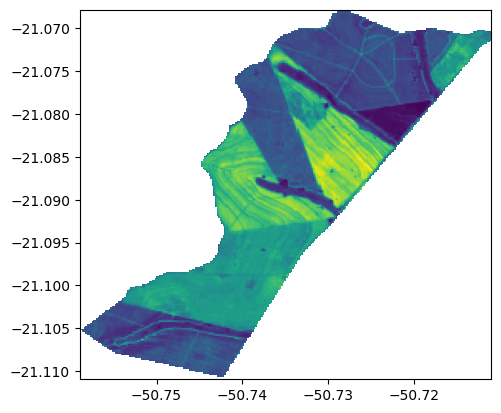

In [ ]:
with rasterio.open('/content/images_to_merge/img1.tif') as src1:
    show(src1)

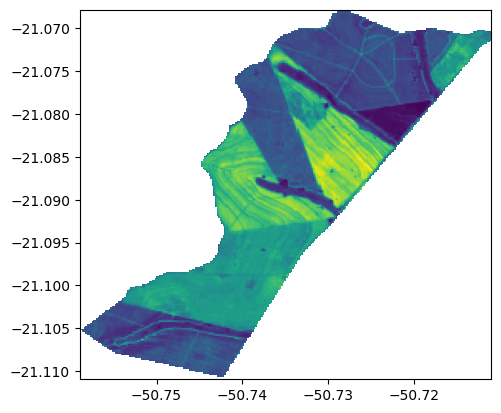

In [ ]:
with rasterio.open('/content/images_to_merge/img2.tif') as src2:
    show(src2)

Agora podemos aplicar o mosaicamento ou a junção das imagens em uma única:

In [ ]:
out_meta = src1.meta

In [ ]:
images_files = [f for f in os.listdir(path_merge)]
print(images_files)

['img1.tif', 'img2.tif']


In [ ]:
src_files_to_mosaic = []
for fp in images_files:
  src = rasterio.open(os.path.join(path_merge,fp))
  src_files_to_mosaic.append(src)

In [ ]:
mosaic, out_trans = merge(src_files_to_mosaic)

In [ ]:
out_meta.update({"driver": "GTiff",
                 "height": mosaic.shape[1],
                 "width": mosaic.shape[2],
                 "transform": out_trans,
                 "nodata": np.nan,
                 "compress":'lzw'})

Assim podemos salvá-la em unico arquivo, e depois plotar para ver o resultado:

In [ ]:
path_exp = '/content/merged_mosaic.tif'
with rasterio.open(path_exp, "w", **out_meta) as dest:
    dest.write(mosaic)

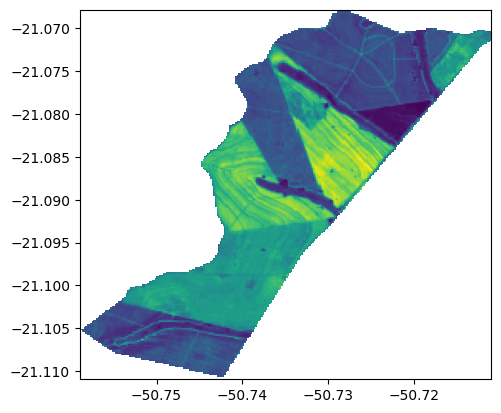

In [ ]:
with rasterio.open(path_exp) as src:
    show(src)

## Operações entre Vetores e Raster com Geopandas e Rasterio

### Recortar imagem com poligonos

Uma tarefa comum no processamento raster é recortar arquivos raster com base em um polígono.

Vamos realizar a intalação do rasterio e geopandas, conectar ao Drive e instalar algumas bibliotecas:

In [ ]:
!pip install rasterio
!pip install geopandas

In [ ]:
import matplotlib.pyplot as plt
import rasterio
import geopandas as gpd
import pandas as pd
import numpy as np
import os
from rasterio.plot import show
from rasterio.mask import mask
import json

Definimos os caminhos do raster e do vetor:

Link: https://drive.google.com/drive/folders/1APsvwpkIqbROjh9McVBK4pjvshgAW5D3?usp=sharing

In [ ]:
rgb_path = '/content/drive/MyDrive/Datasets_AG/Orto_soja/RGB_soja.tif'
aoi_path = '/content/drive/MyDrive/Datasets_AG/Orto_soja/Files/AOI.shp'

Vamos plotar a imagem junto ao poligono:

In [ ]:
gdf = gpd.read_file(aoi_path)

<Axes: >

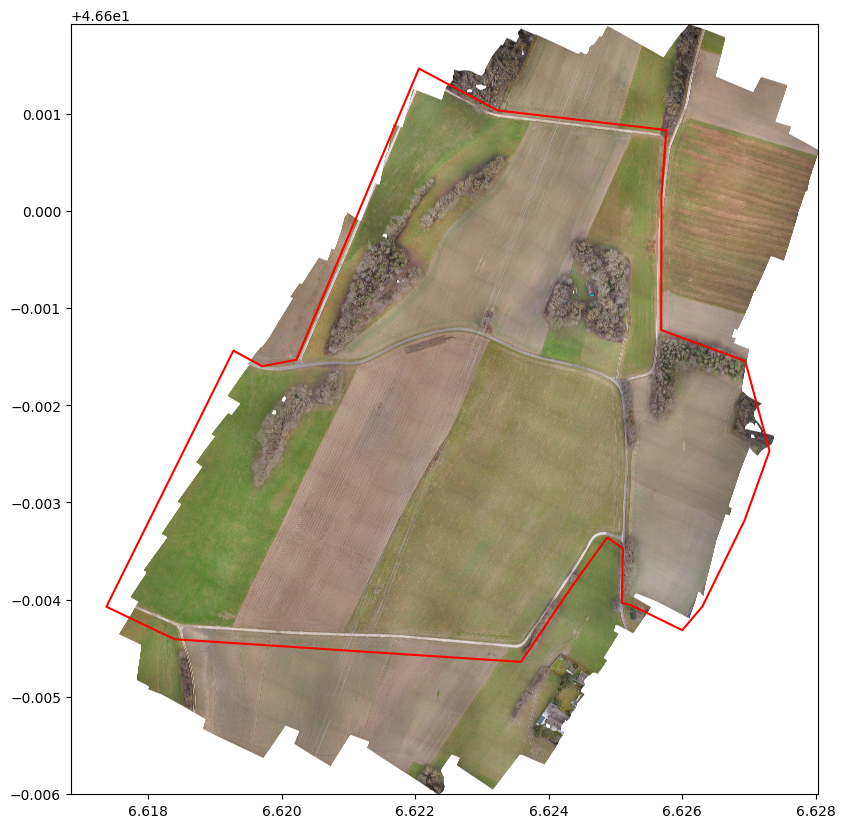

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open(rgb_path) as src:
    gdf = gdf.to_crs(src.crs.to_dict()['init'])
    show(src,ax=ax)
gdf.boundary.plot(ax=ax, edgecolor='red')

Então definimos o caminho onde será salvo o raster:

In [ ]:
path_to_save = '/content/Clip_IMG.tif'

E aplicamos o recorte:

In [ ]:
def getFeatures(gdf):
    """Function to parse features from GeoDataFrame in such a manner that rasterio wants them"""
    import json
    return [json.loads(gdf.to_json())['features'][0]['geometry']]

In [ ]:
with rasterio.open(rgb_path) as dataset:
  gdf_AOI = gdf.to_crs(dataset.crs.to_dict()['init'])
coords = getFeatures(gdf)
with rasterio.open(rgb_path) as src:
  out_img, out_transform = mask(dataset=src, shapes=coords, crop=True)
  out_meta = src.meta.copy()
out_meta.update({"driver": "GTiff",
                    "height": out_img.shape[1],
                    "width": out_img.shape[2],
                    "compress":'lzw',
                    "transform": out_transform})
with rasterio.open(path_to_save, "w", **out_meta) as dest:
    dest.write(out_img)
del out_img

Vamos ver o resultado:

<Axes: >

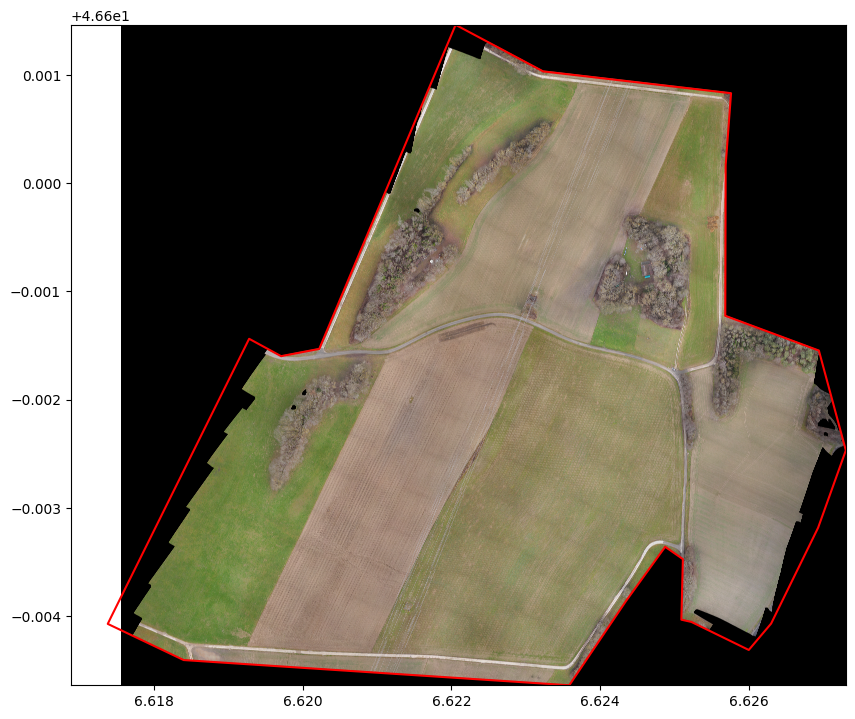

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open('/content/Clip_IMG.tif') as src:
    gdf = gdf.to_crs(src.crs.to_dict()['init'])
    show(src,ax=ax)
gdf.boundary.plot(ax=ax, edgecolor='red')

### Recortando várias imagens com um shapefile:

Agora vamos recortar várias imagens usando um mesmo polígono:

In [ ]:
folder_path = '/content/drive/MyDrive/Datasets_AG/Orto_soja/Indexes'
aoi_path = '/content/drive/MyDrive/Datasets_AG/Orto_soja/Files/Lotes.shp'

In [ ]:
gdf = gpd.read_file(aoi_path)

<Axes: >

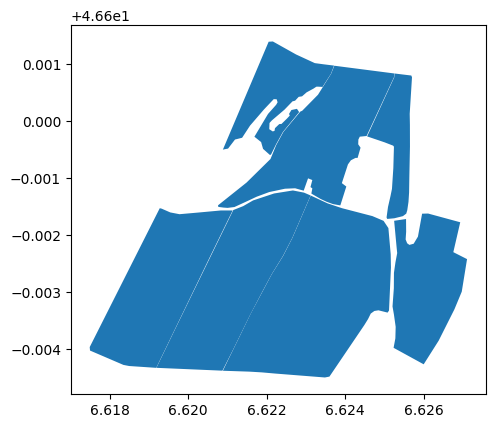

In [ ]:
gdf.plot()

Listamos as imagens:

In [ ]:
os.listdir(folder_path)

['GREEN.tif', 'RED.tif', 'REDEDGE.tif', 'NIR.tif']

Criamos uma pasta para salvá-las:

In [ ]:
path_to_save = '/content/Indexes_cliped'
if not os.path.isdir(path_to_save):
  os.mkdir(path_to_save)

Aplicamos o recorte e salvamos o resultado:

In [ ]:
for i in os.listdir(folder_path):
  filename = os.path.join(folder_path,i)
  with rasterio.open(filename) as dataset:
    gdf = gdf.to_crs(dataset.crs.to_dict()['init'])
  gdf_json = gdf.to_json()
  gdf_json = json.loads(gdf_json)
  coords = [feature["geometry"] for feature in gdf_json["features"]]

  with rasterio.open(filename) as src:
    out_img, out_transform = mask(dataset=src, shapes=coords, crop=True)
    out_meta = src.meta.copy()
  out_img = out_img[0:1]
  out_meta.update({"driver": "GTiff",
                      "height": out_img.shape[1],
                      "width": out_img.shape[2],
                      "compress":'lzw',
                      "count":1,
                      "transform": out_transform,
                      "nodata" : 0})
  path_to_save_clip = os.path.join(path_to_save,i)
  print(path_to_save_clip)
  with rasterio.open(path_to_save_clip, "w", **out_meta) as dest:
      dest.write(out_img)
  del out_img, out_meta,dataset

/content/Indexes_cliped/GREEN.tif
/content/Indexes_cliped/RED.tif
/content/Indexes_cliped/REDEDGE.tif
/content/Indexes_cliped/NIR.tif


### Criando várias imagens a partir de cada polígono

Também é possíve recortar uma imagem com vários poligonos, gerando diferentes imagens que serão salvas em arquivos rasters.

Link: https://drive.google.com/drive/folders/1AvQRjcowWtAdEnGveadG3f8RRktPaq-V?usp=drive_link

In [ ]:
aoi_path = '/content/drive/MyDrive/Datasets_AG/Orto_cana/Cana_RGB.tif'
Polys_paths = '/content/drive/MyDrive/Datasets_AG/Orto_cana/Fields.shp'

In [ ]:
gdf = gpd.read_file(Polys_paths)

<Axes: >

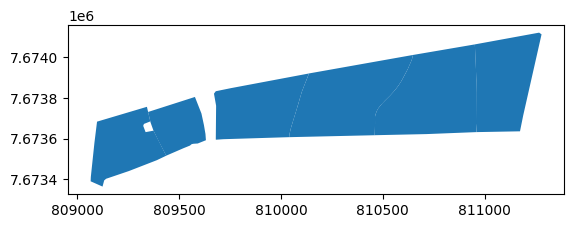

In [ ]:
gdf.plot()

Criamos uma pasta para receber os resultados:

In [ ]:
path_to_save = '/content/Poly_IMGS'
if not os.path.isdir(path_to_save):
  os.mkdir(path_to_save)

In [ ]:
for feat in json.loads(gdf.to_json())['features']:

  name_poly = 'Lote_' + str(feat['properties']['id'])
  coords = [feat['geometry']]

  with rasterio.open(aoi_path) as src:
    out_img, out_transform = mask(dataset=src, shapes=coords, crop=True)
    out_meta = src.meta.copy()

  out_meta.update({"driver": "GTiff",
                      "height": out_img.shape[1],
                      "width": out_img.shape[2],
                      "compress":'lzw',
                      "transform": out_transform})
  path_to_save_clip = os.path.join(path_to_save,name_poly + '.tif')
  print(path_to_save_clip)

  with rasterio.open(path_to_save_clip, "w", **out_meta) as dest:
      dest.write(out_img)
  del out_img, out_meta,src


/content/Poly_IMGS/Lote_1.tif
/content/Poly_IMGS/Lote_2.tif
/content/Poly_IMGS/Lote_3.tif
/content/Poly_IMGS/Lote_4.tif
/content/Poly_IMGS/Lote_5.tif
/content/Poly_IMGS/Lote_6.tif


Vamos ver um exemplo:

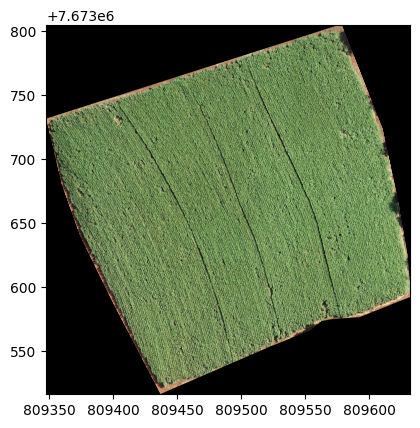

In [ ]:
with rasterio.open('/content/Poly_IMGS/Lote_2.tif') as src:
    show(src)

### Extrair valores com pontos

A extração de valores das imagens a partir de um conjunto de pontos é uma das operções mais comuns, e pode ser realizada fácilmente com o uso do rasterio e do geopandas:

Link: https://drive.google.com/drive/folders/1h_Rldbu5jacMsc8nmeCgVxV4xNE7zSbY?usp=sharing

In [ ]:
path_AOI = '/content/drive/MyDrive/Datasets_AG/Orto_NDVI/AOI.shp'
path_NDVI = '/content/drive/MyDrive/Datasets_AG/Orto_NDVI/NDVI-DroneMapper.tif'

Vamos plotar nossa área de interesse na imagem:

In [ ]:
gdf = gpd.read_file(path_AOI)

<Axes: >

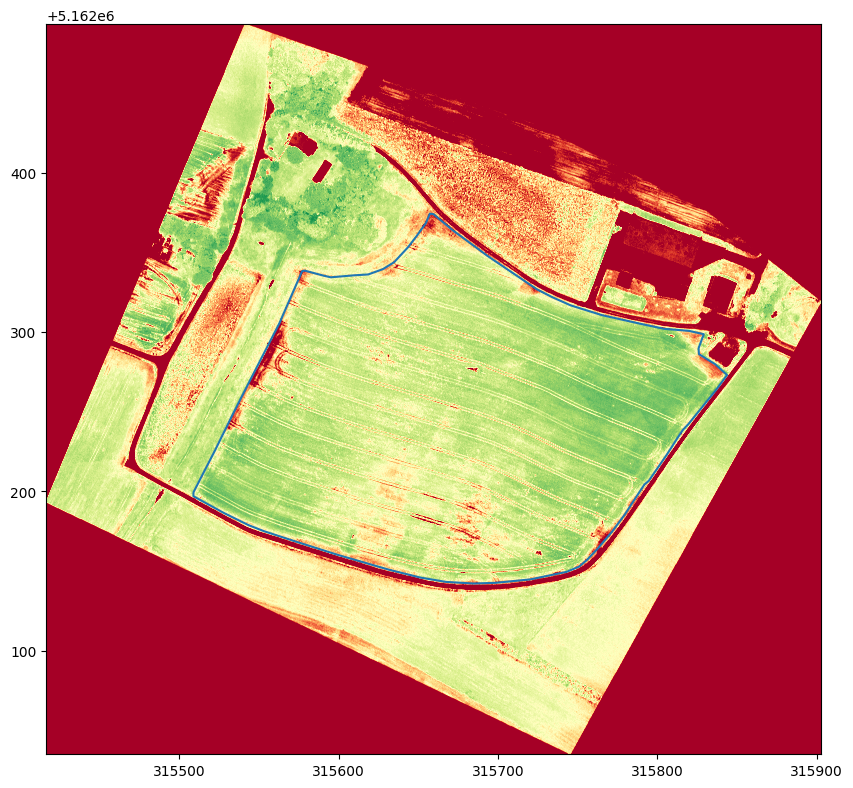

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open(path_NDVI) as src:
    gdf = gdf.to_crs(src.crs.to_dict()['init'])
    show(src,ax=ax, cmap='RdYlGn', vmin=0, vmax=1)
gdf.boundary.plot(ax=ax)

Criamos 200 pontos aleatórios dentro da nossa área de análise.

In [ ]:
gdf_sampled_points = gdf.sample_points(200)

In [ ]:
gdf_sampled_points

0    MULTIPOINT (315512.380 5162202.722, 315520.960...
Name: sampled_points, dtype: geometry

In [ ]:
gdf_sampled_points = gdf_sampled_points.explode(index_parts=False)

In [ ]:
gdf_sampled_points.reset_index(drop=True, inplace=True)

<Axes: >

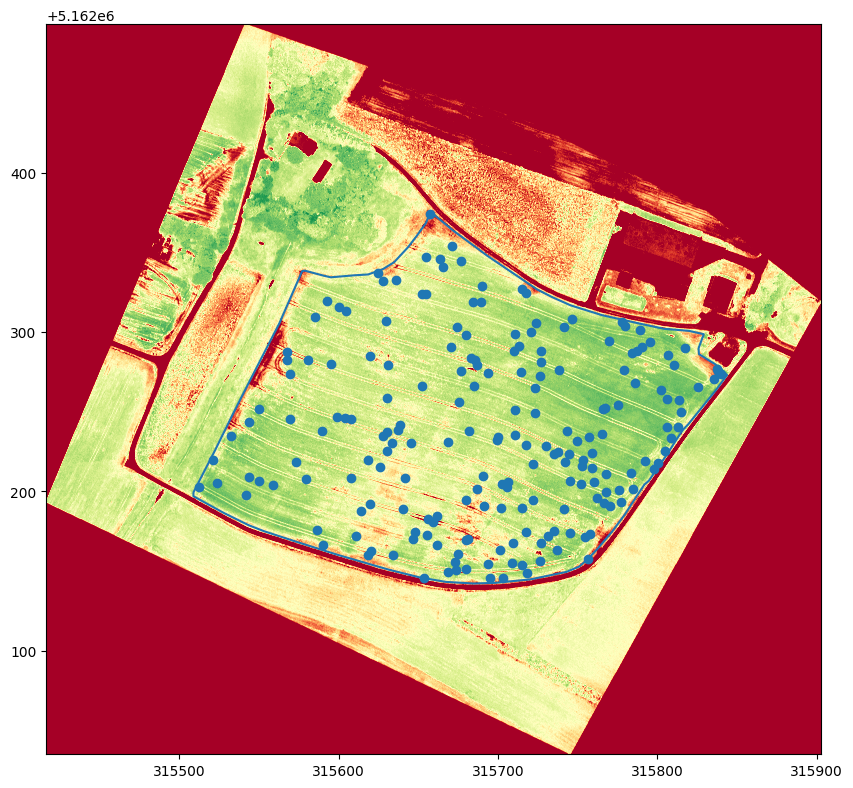

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open(path_NDVI) as src:
    show(src,ax=ax, cmap='RdYlGn', vmin=0, vmax=1)
gdf.boundary.plot(ax=ax)
gdf_sampled_points.plot(ax=ax)

O Rasterio requer uma lista das coordenadas no formato x,y em vez dos pontos que estão na coluna de geometria.

In [ ]:
coord_list = [(x, y) for x, y in zip(gdf_sampled_points.x, gdf_sampled_points.y)]

Com isso podemos realizar a amostragem:

In [ ]:
with rasterio.open(path_NDVI) as src:
  Values = [x for x in src.sample(coord_list)]

In [ ]:
gdf_values = gpd.GeoDataFrame(Values, columns=['NDVI'], geometry=gdf_sampled_points)

In [ ]:
gdf_values

,NDVI,geometry
0,0.065421,POINT (315512.380 5162202.722)
1,0.230769,POINT (315520.960 5162219.435)
2,0.790698,POINT (315523.766 5162205.067)
3,0.821656,POINT (315532.635 5162234.492)
4,0.677419,POINT (315541.901 5162197.751)
...,...,...
195,0.776471,POINT (315825.192 5162265.312)
196,0.142857,POINT (315835.596 5162270.546)
197,-0.016667,POINT (315837.083 5162276.444)
198,0.404580,POINT (315837.712 5162275.483)


Com resultado em um geodataframe, podemos ver a distribuição dos valores encontrados:

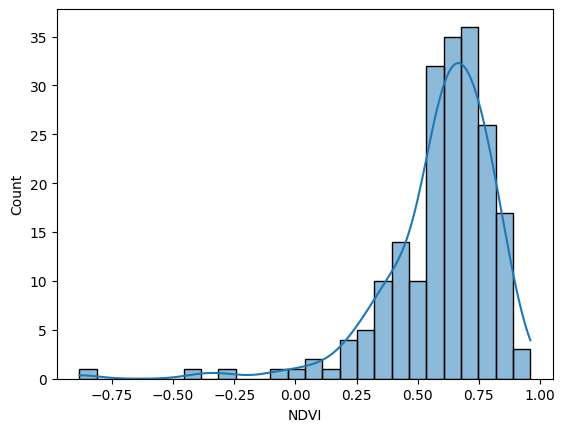

In [ ]:
import seaborn as sns

sns.histplot(gdf_values['NDVI'],kde=True)
plt.show()

### Extrair valores com linhas

É possível usar linhas para extrair os valores de uma imagem. Por exemplo, vamos fazer um perfil de altitude a partir de um DEM:

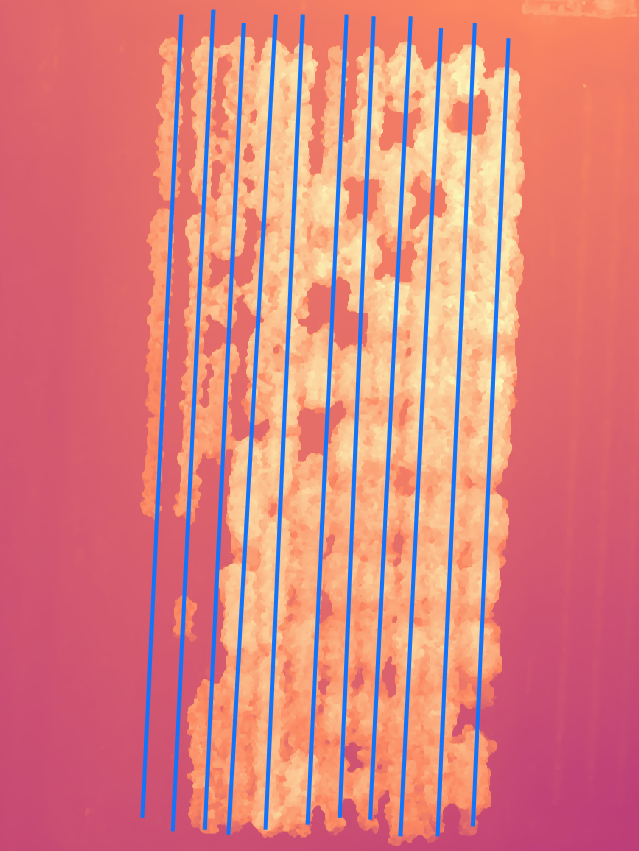

Link: https://drive.google.com/drive/folders/1VGXbQX8qCFWy_QgilE0Uyn2Taau4Zo5d?usp=sharing

In [ ]:
elevation_model = ("/content/drive/MyDrive/Datasets_AG/Orto_DEM_UVA/DEM-DroneMapper.tif")

In [ ]:
lines = gpd.read_file('/content/drive/MyDrive/Datasets_AG/Orto_DEM_UVA/Wines_rows.shp')

Vamos usar apenas a primeira linha:

In [ ]:
line = lines.iloc[1].geometry

Com a linha, vamos criar pontos a cada 2 metros e amostrar os valores de altitude nesses pontos:

In [ ]:
sample_distance = 2
distances = np.arange(0, line.length, sample_distance)
points = [line.interpolate(distance) for distance in distances]
coord_list = [(p.x, p.y) for p in points]
with rasterio.open(elevation_model) as src:
  Values = [x for x in src.sample(coord_list)]

In [ ]:
gdf_elevation = gpd.GeoDataFrame(Values, columns=['Elevation'], geometry=points)

In [ ]:
gdf_elevation['Distances'] = distances

Assim podemos criar um gráfico:

Text(0.5, 1.0, 'DEM Profile')

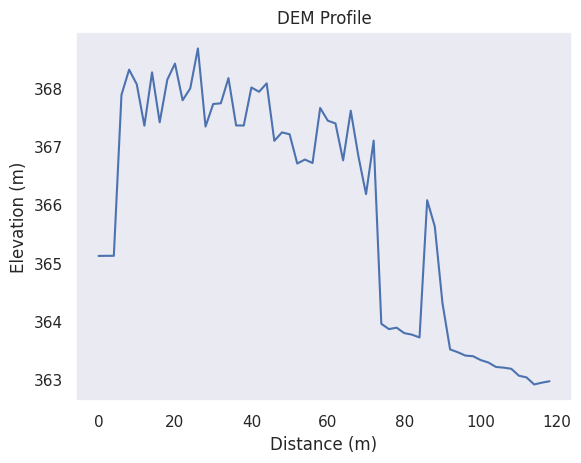

In [ ]:
sns.set()
sns.set_style("dark")
plt.plot(gdf_elevation['Distances'],gdf_elevation['Elevation'])
plt.xlabel("Distance (m)")
plt.ylabel("Elevation (m)")
plt.title("DEM Profile")

### Extrair valores com poligonos

A extração de valores por poligonos pode ser também chamada de estatísticas por zona, onde obtemos diversas estatísticas a partir do conjunto de pixels de cada área.

In [ ]:
aoi_path = '/content/drive/MyDrive/Datasets_AG/Orto_cana/Cana_RGB.tif'
Polys_paths = '/content/drive/MyDrive/Datasets_AG/Orto_cana/Fields.shp'

In [ ]:
gdf = gpd.read_file(Polys_paths)

In [ ]:
R_mean = []
G_mean = []
B_mean = []
R_min = []
G_min = []
B_min = []
R_max = []
G_max = []
B_max = []
R_std = []
G_std = []
B_std = []
for feat in json.loads(gdf.to_json())['features']:
  with rasterio.open(aoi_path) as src:
    out_img, out_transform = mask(dataset=src, shapes=[feat['geometry']], crop=True)

  red = np.nan_to_num(out_img[0])
  green = np.nan_to_num(out_img[1])
  blue = np.nan_to_num(out_img[2])

  del out_img

  R_mean.append(red[red != 0].mean())
  G_mean.append(green[green != 0].mean())
  B_mean.append(blue[blue != 0].mean())

  R_min.append(red[red != 0].min())
  G_min.append(green[green != 0].min())
  B_min.append(blue[blue != 0].min())

  R_max.append(red[red != 0].max())
  G_max.append(green[green != 0].max())
  B_max.append(blue[blue != 0].max())

  R_std.append(red[red != 0].std())
  G_std.append(green[green != 0].std())
  B_std.append(blue[blue != 0].std())

In [ ]:
gdf['R_mean'] = R_mean
gdf['G_mean'] = G_mean
gdf['B_mean'] = B_mean
gdf['R_min'] = R_min
gdf['G_min'] = G_min
gdf['B_min'] = B_min
gdf['R_max'] = R_max
gdf['G_max'] = G_max
gdf['B_max'] = B_max
gdf['R_std'] = R_std
gdf['G_std'] = G_std
gdf['B_std'] = B_std

Juntamos essas estatísticas em um dataframe:

In [ ]:
gdf

,id,Nome,Tipo,Prod,Cultivo,Data_plant,geometry,R_mean,G_mean,B_mean,R_min,G_min,B_min,R_max,G_max,B_max,R_std,G_std,B_std
0,1,Lote A,Cana A,5600.50,S,2023-03-01,"POLYGON ((809124.189 7673364.675, 809065.760 7...",102.928523,125.329668,87.798604,1,1,1,255,255,250,41.102903,45.221093,37.393504
1,2,Lote B,Cana B,3241.70,S,2023-02-01,"POLYGON ((809347.771 7673731.038, 809577.898 7...",112.075683,138.831953,85.206068,1,3,1,255,255,231,37.308604,42.073299,34.480312
2,3,Lote C,Cana A,4827.65,S,2022-09-07,"POLYGON ((809680.348 7673596.904, 809681.720 7...",112.359126,132.865605,92.982192,1,1,1,255,255,238,50.873341,50.001470,42.359479
3,4,Lote D,Cana C,0.00,N,2022-06-21,"POLYGON ((810137.945 7673920.263, 810648.825 7...",149.655538,108.623205,87.600246,6,1,1,255,255,245,50.373164,51.832324,42.974023
4,5,Lote E,Cana B,8537.66,S,2023-01-19,"POLYGON ((810460.511 7673616.946, 810462.355 7...",108.683131,135.300682,86.457590,1,1,1,254,255,238,37.947260,43.125533,35.693415
5,6,Lote F,Cana A,4998.31,S,2023-03-15,"POLYGON ((810952.517 7674062.904, 811268.215 7...",104.540106,125.444581,89.924659,1,1,1,255,255,244,42.946003,48.017837,39.268494


### Converter raster para poligono


A conversão de raster para polígono é o processo de converter dados raster, que são representados em forma de grade ou matriz de células, em polígonos, que são formas geométricas compostas por vértices conectados por segmentos de linha.

Em um raster, cada célula contém um valor que representa uma característica ou atributo em um determinado local. A conversão de raster para polígono é útil quando você deseja representar esses valores como polígonos, o que pode ser mais adequado para certas análises espaciais, visualizações ou operações de geoprocessamento.

Durante a conversão, cada célula do raster é analisada e, com base em um determinado critério, é criado um polígono correspondente. Geralmente, isso envolve a identificação de células com valores específicos (por exemplo, células com valores não nulos) e a criação de polígonos que representam essas células.

Os polígonos resultantes podem ser usados para realizar análises adicionais, como cálculos de área, identificação de contornos ou sobreposição com outros dados espaciais.

In [ ]:
path_AOI = '/content/drive/MyDrive/Datasets_AG/Orto_NDVI/AOI.shp'
path_NDVI = '/content/drive/MyDrive/Datasets_AG/Orto_NDVI/NDVI_Cliped.tif'

Vamos usar uma imagem NDVI, categoriza-lá e converter a imagem classificada em poligonos:

In [ ]:
with rasterio.open(path_NDVI) as src:
  ndvi_img = src.read()
  mask_img = src.read_masks()

(-0.5, 9485.5, 6572.5, -0.5)

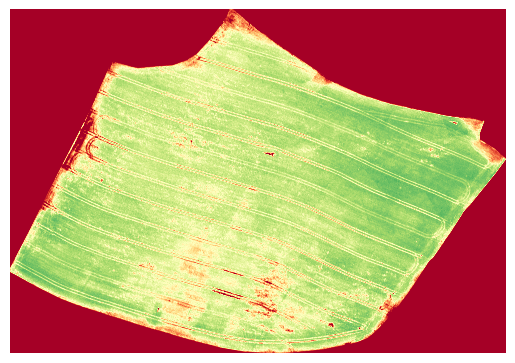

In [ ]:
plt.imshow(ndvi_img[0], cmap='RdYlGn', vmin=0, vmax=1)
plt.axis('off')

Vamos normalizar a imagem e aplicar a equalização do histograma:

In [ ]:
import cv2

In [ ]:
ndvi_int = cv2.normalize(ndvi_img[0], None, 255, 0, cv2.NORM_MINMAX, cv2.CV_8U)

In [ ]:
img_equ = cv2.equalizeHist(ndvi_int.astype(np.uint8))

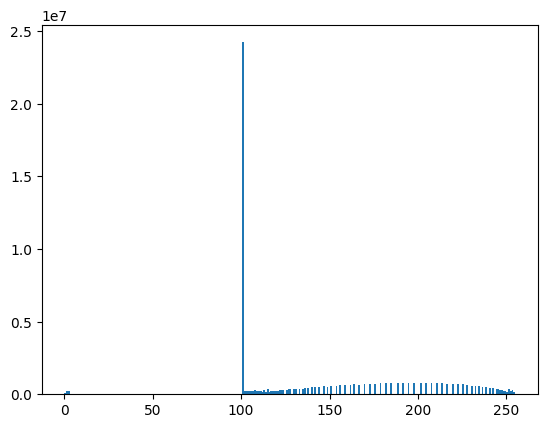

In [ ]:
ax = plt.hist(img_equ.ravel(), bins = 256)
plt.show()

Agora definimos os intervalos de separação por cada classe:

In [ ]:
ndvi_class_bins = [110,150,200,230]
ndvi_classified = np.digitize(ndvi_int, ndvi_class_bins)

In [ ]:
np.unique(ndvi_classified)

array([0, 1, 2, 3, 4])

Vamos plotar o resultado:

In [ ]:
import matplotlib.colors as colors
cmap = colors.ListedColormap(['red', 'orange','yellow', 'green', 'darkgreen'])

(-0.5, 9485.5, 6572.5, -0.5)

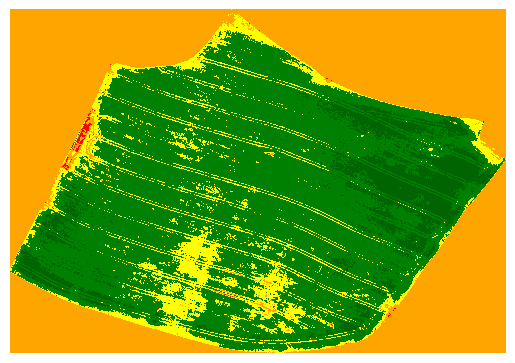

In [ ]:
plt.imshow(ndvi_classified, cmap=cmap, vmin=0, vmax=4)
plt.axis('off')

Como a imagem tem muitos pixesl ruidosos, vamos aplicar uma filtragem majoritária:

In [ ]:
from skimage.filters.rank import modal
from skimage.filters.rank import majority
from skimage.morphology import disk, ball

In [ ]:
result_img = majority(ndvi_classified,mask=mask_img[0], footprint=disk(70))

<ipython-input-16-8e2bd5449c90>:1: UserWarning: Possible precision loss converting image of type int64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  result_img = majority(ndvi_classified,mask=mask_img[0], footprint=disk(70))
/usr/local/lib/python3.10/dist-packages/skimage/util/dtype.py:541: UserWarning: Downcasting int64 to uint8 without scaling because max value 4 fits in uint8
  return _convert(image, np.uint8, force_copy)


(-0.5, 9485.5, 6572.5, -0.5)

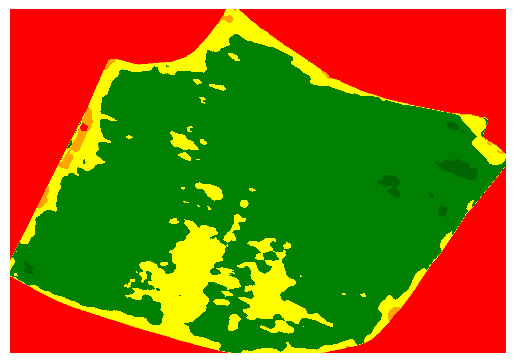

In [ ]:
plt.imshow(result_img, cmap=cmap, vmin=0, vmax=4)
plt.axis('off')

Assim podemos realizar a conversão de raster para poligono:

In [ ]:
from rasterio.features import shapes
from shapely.geometry import shape

In [ ]:
shape_gen = ((shape(s), v) for s, v in shapes(result_img, mask=mask_img[0], transform=src.transform))

In [ ]:
Poly_gdf = gpd.GeoDataFrame(dict(zip(["geometry", "class"], zip(*shape_gen))), crs=src.crs)

In [ ]:
Poly_gdf

,geometry,class
0,"POLYGON ((315659.739 5162373.628, 315659.739 5...",1.0
1,"POLYGON ((315659.775 5162373.592, 315659.775 5...",1.0
2,"POLYGON ((315660.057 5162373.345, 315660.057 5...",1.0
3,"POLYGON ((315660.128 5162373.310, 315660.128 5...",1.0
4,"POLYGON ((315658.892 5162370.980, 315658.892 5...",1.0
...,...,...
453,"POLYGON ((315787.538 5162199.264, 315787.926 5...",2.0
454,"POLYGON ((315626.766 5162232.591, 315626.801 5...",2.0
455,"POLYGON ((315716.260 5162144.438, 315716.260 5...",3.0
456,"POLYGON ((315660.340 5162357.035, 315660.516 5...",3.0


Vamos plotar o geodataframe:

<Axes: >

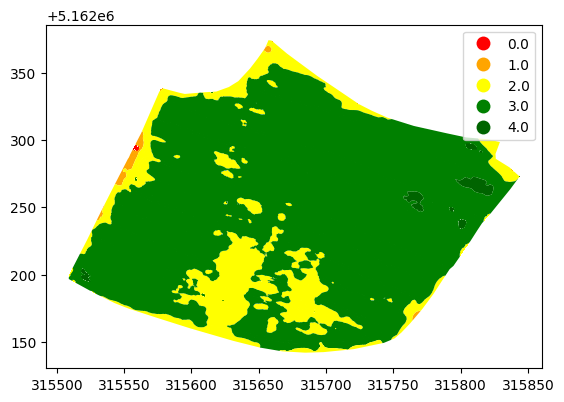

In [ ]:
Poly_gdf.plot("class",legend=True,categorical=True, cmap=cmap)

E salvar como um shapefile:

In [ ]:
Poly_gdf.to_file('NDVI_class.shp')

### Converter poligono para raster

Rasterizar vetores pode ser útil se você quiser incorporar dados vetoriais (ou seja, ponto, linha ou polígono) em sua análise raster. O processo é essencialmente o que o nome sugere: pegamos um vetor e o convertemos em pixels. Isso pode ser feito com rasterio.

In [ ]:
from rasterio.features import rasterize

In [ ]:
shape_target = src.shape
out_arr = np.zeros(shape_target)
out_target = src.meta.copy()
mask_rasterized = rasterize( [(x.geometry, x['class']) for i, x in Poly_gdf.iterrows()],
                                transform=src.transform,
                                fill=255,
                                out = out_arr,
                                dtype=rasterio.float32)
del out_arr
out_target.update({"driver": "GTiff",
                              "nodata":255,
                               "dtype":rasterio.float32,
                               "compress":'lzw',
                               "count":1})
path_exp_target = '/content/NDVI_class.tif'
with rasterio.open(path_exp_target, 'w', **out_target) as msk:
    msk.write(mask_rasterized, indexes=1)

# Caso de Uso:


In [ ]:
import matplotlib.pyplot as plt
import rasterio
import geopandas as gpd
import pandas as pd
import numpy as np
import os
from rasterio.plot import show
from rasterio.mask import mask
from rasterio.warp import calculate_default_transform, reproject, Resampling
import json
import cv2

Link: https://drive.google.com/drive/folders/1VGXbQX8qCFWy_QgilE0Uyn2Taau4Zo5d?usp=sharing

In [ ]:
img_path = '/content/drive/MyDrive/Datasets_AG/Orto_DEM_UVA/Ortho-DrnMppr.tif'
chm_path = ("/content/drive/MyDrive/Datasets_AG/Orto_DEM_UVA/CHM.tif")
aoi_path = '/content/drive/MyDrive/Datasets_AG/Orto_DEM_UVA/Analisys/AOI_UVA.shp'
lotes_path = '/content/drive/MyDrive/Datasets_AG/Orto_DEM_UVA/Analisys/Lotes.shp'
linhas_path = '/content/drive/MyDrive/Datasets_AG/Orto_DEM_UVA/Analisys/Linhas.shp'

In [ ]:
aoi = gpd.read_file(aoi_path)
lotes = gpd.read_file(lotes_path)

In [ ]:
with rasterio.open(img_path) as src:
  R = src.read(3)
  G = src.read(2)
  B = src.read(1)

In [ ]:
R = R / (2**16)
G = G / (2**16)
B = B / (2**16)

In [ ]:
rgb = np.dstack((R,G,B))

In [ ]:
rgb.max()

0.8567352294921875

In [ ]:
rgb.shape

(7542, 9418, 3)

In [ ]:
bounds  = src.bounds
Xmin = bounds[0]
Ymin = bounds[1]
Xmax = bounds[2]
Ymax = bounds[3]
extends = (Xmin, Xmax, Ymin, Ymax)

<Axes: >

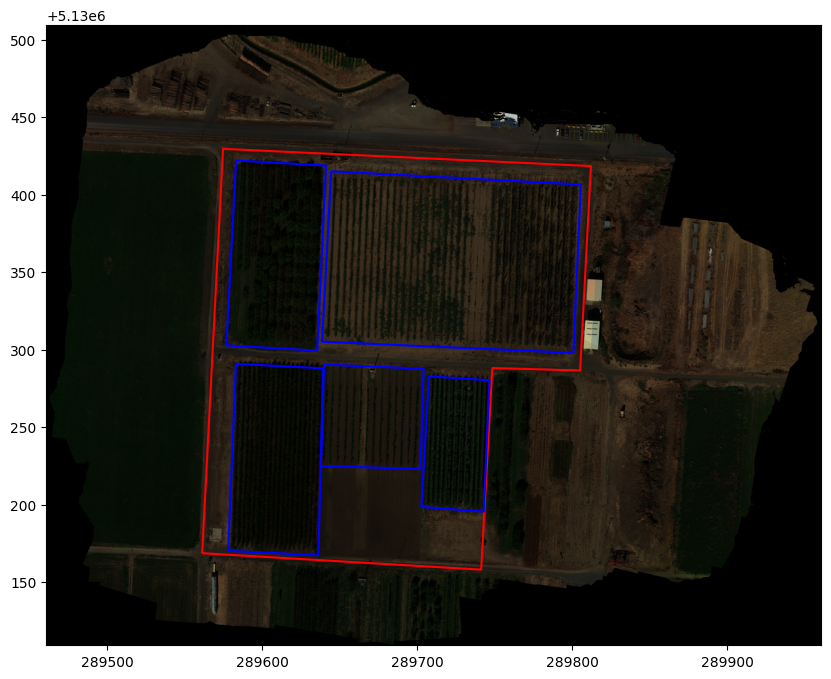

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(rgb * 1.4, extent=extends)
aoi.boundary.plot(ax=ax, edgecolor='red')
lotes.boundary.plot(ax=ax, edgecolor='blue')

# Recortar Área de Interesse

In [ ]:
def getFeatures(gdf):
    """Function to parse features from GeoDataFrame in such a manner that rasterio wants them"""
    import json
    return [json.loads(gdf.to_json())['features'][0]['geometry']]

def clip_image(path_to_clip,gdf_AOI,path_to_save):
  coords = getFeatures(gdf_AOI)
  with rasterio.open(path_to_clip) as src:
    out_img, out_transform = mask(dataset=src, shapes=coords, crop=True)
    out_meta = src.meta.copy()
  out_meta.update({"driver": "GTiff",
                    "height": out_img.shape[1],
                    "width": out_img.shape[2],
                    "compress":'lzw',
                    "transform": out_transform})
  with rasterio.open(path_to_save, "w", **out_meta) as dest:
      dest.write(out_img)

In [ ]:
def reasmpled_img(path_img,path_save,height,width):
  with rasterio.open(path_img) as dataset:
      data = dataset.read(
          out_shape=(
              dataset.count,
              int(height),
              int(width)
          ),
          resampling=Resampling.bilinear
      )
      transform = dataset.transform * dataset.transform.scale(
          (dataset.width / data.shape[-1]),
          (dataset.height / data.shape[-2])
      )
      profile = dataset.profile
  profile.update(transform=transform, driver='GTiff', height=data.shape[-2], width=data.shape[-1], crs=dataset.crs, compress='lzw')
  with rasterio.open(os.path.join(path_save),'w', **profile) as dst:
    dst.write(data)

In [ ]:
path_repj = '/content/CLIP'
if not os.path.isdir(path_repj):
  os.mkdir(path_repj)

chm_path_clip = '/content/CLIP/CHM_clip.tif'
img_path_clip = '/content/CLIP/RGB_clip.tif'

gdf_AOI = gpd.read_file(aoi_path)


clip_image(chm_path,gdf_AOI,chm_path_clip)
clip_image(img_path,gdf_AOI,img_path_clip)

In [ ]:
src_img = rasterio.open(img_path_clip)

In [ ]:
height = src_img.height
width = src_img.width

In [ ]:
reasmpled_img(chm_path_clip,'/content/CLIP/CHM_resampled.tif',height,width)

#Criar Indices espectrais

In [ ]:
src_chm = rasterio.open('/content/CLIP/CHM_resampled.tif')
chm = src_chm.read()

In [ ]:
chm.shape

(1, 5114, 4725)

In [ ]:
img = src_img.read()

In [ ]:
img.shape

(7, 5114, 4725)

In [ ]:
R = img[2] / (2**16)
G = img[1] / (2**16)
B = img[0] / (2**16)
RE = img[4] / (2**16)
N = img[3] / (2**16)
T = (img[5]/100)-273.15

In [ ]:
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [ ]:
ndvi = (N.astype(float) - R.astype(float)) / (N + R)

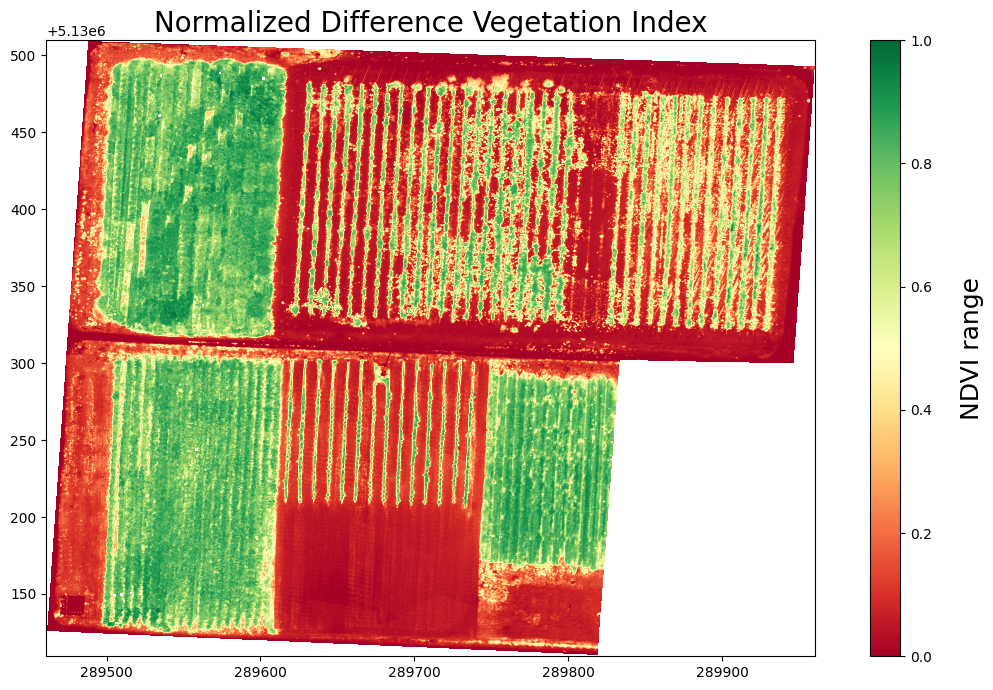

In [ ]:
plt.figure(figsize=[14,8])
plt.imshow(ndvi, extent=extends, cmap='RdYlGn', vmin=0, vmax=1)
plt.title('Normalized Difference Vegetation Index',fontsize = 20)
cbar = plt.colorbar()
cbar.set_label('NDVI range',rotation=90,labelpad=20,fontsize = 18)

In [ ]:
out_target = src_img.meta.copy()

In [ ]:
out_target.update({"driver": "GTiff",
                               "dtype":rasterio.float32,
                               "compress":'lzw',
                               "count":1})
path_exp_target = '/content/NDVI.tif'
with rasterio.open(path_exp_target, 'w', **out_target) as msk:
    msk.write(ndvi, indexes=1)

In [ ]:
ndre = (N.astype(float) - RE.astype(float)) / (N + RE)

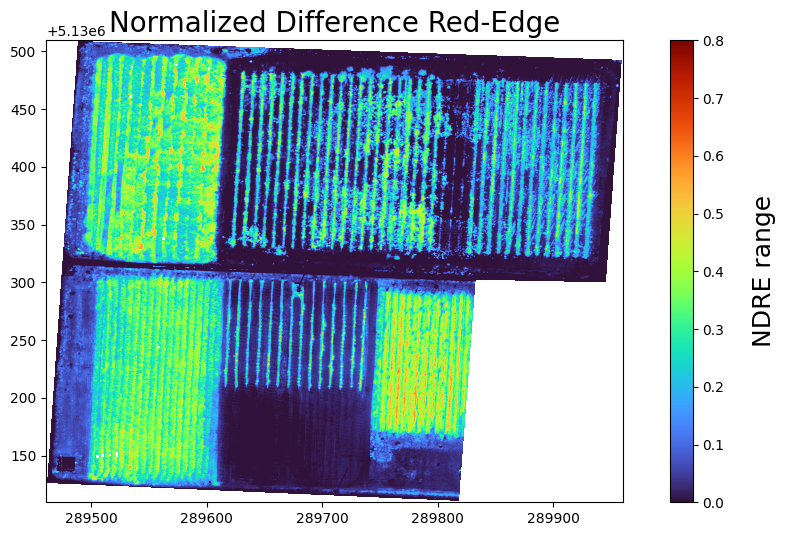

In [ ]:
plt.figure(figsize=[12,6])
plt.imshow(ndre, extent=extends, cmap='turbo', vmin=0, vmax=0.8)
plt.title('Normalized Difference Red-Edge',fontsize = 20)
cbar = plt.colorbar()
cbar.set_label('NDRE range',rotation=90,labelpad=20,fontsize = 18)

In [ ]:
out_target = src_img.meta.copy()

In [ ]:
out_target.update({"driver": "GTiff",
                               "dtype":rasterio.float32,
                               "compress":'lzw',
                               "count":1})
path_exp_target = '/content/NDRE.tif'
with rasterio.open(path_exp_target, 'w', **out_target) as msk:
    msk.write(ndre, indexes=1)

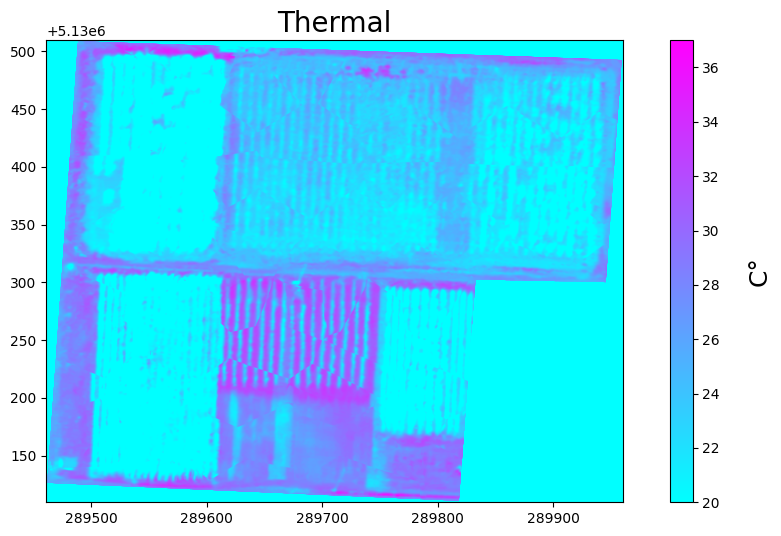

In [ ]:
plt.figure(figsize=[12,6])
plt.imshow(T, extent=extends, cmap='cool', vmin=20, vmax=37)
plt.title('Thermal',fontsize = 20)
cbar = plt.colorbar()
cbar.set_label('C°',rotation=90,labelpad=20,fontsize = 18)

In [ ]:
out_target = src_img.meta.copy()

In [ ]:
out_target.update({"driver": "GTiff",
                               "dtype":rasterio.float32,
                               "compress":'lzw',
                               "count":1})
path_exp_target = '/content/Thermal.tif'
with rasterio.open(path_exp_target, 'w', **out_target) as msk:
    msk.write(T, indexes=1)

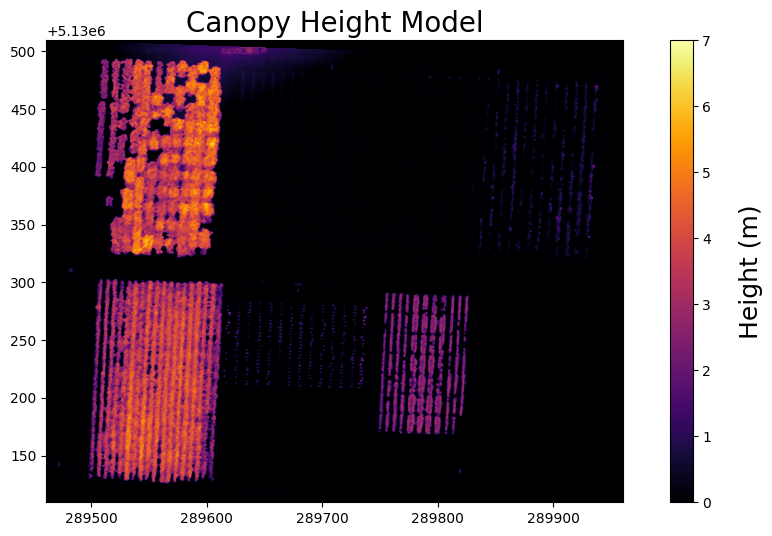

In [ ]:
plt.figure(figsize=[12,6])
plt.imshow(chm[0], extent=extends, cmap='inferno', vmin=0, vmax=7)
plt.title('Canopy Height Model',fontsize = 20)
cbar = plt.colorbar()
cbar.set_label('Height (m)',rotation=90,labelpad=20,fontsize = 18)

# Gerar Mapa de área Foliar usando um NDVI e o CHM

In [ ]:
ndvi.shape

(5114, 4725)

In [ ]:
ret,thresh1 = cv2.threshold(ndvi,0.3,1,cv2.THRESH_BINARY)

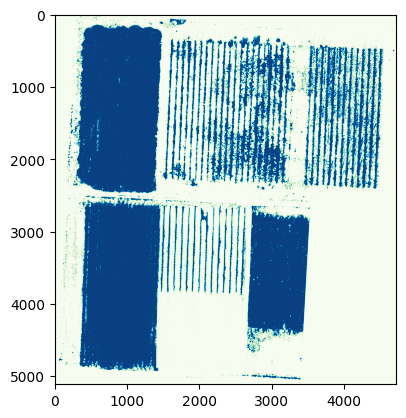

In [ ]:
plt.imshow(thresh1, cmap='GnBu')

In [ ]:
ret,thresh2 = cv2.threshold(chm[0],1,255,cv2.THRESH_BINARY)

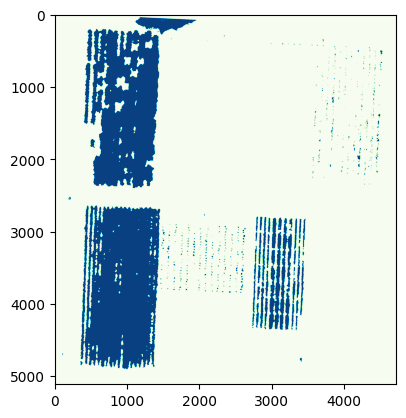

In [ ]:
plt.imshow(thresh2, cmap='GnBu')

In [ ]:
plants_mask =  cv2.bitwise_and(thresh1.astype('uint8'),thresh2.astype('uint8'))

Text(0.5, 1.0, 'Area Foliar')

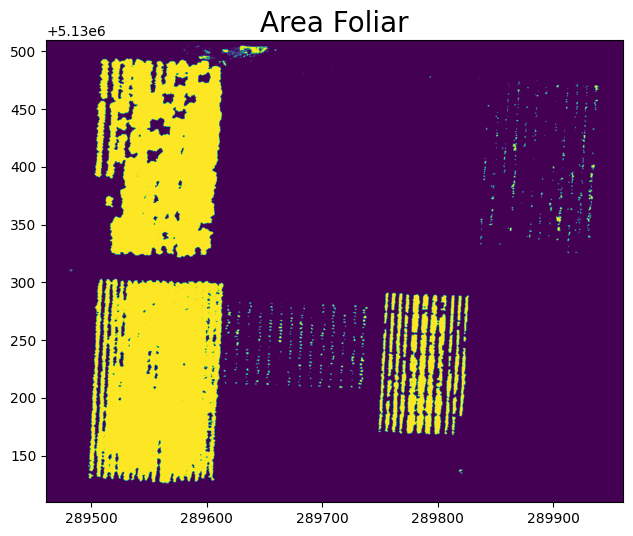

In [ ]:
plt.figure(figsize=[12,6])
plt.imshow(plants_mask, extent=extends)
plt.title('Area Foliar',fontsize = 20)

In [ ]:
out_target = src_img.meta.copy()

In [ ]:
out_target.update({"driver": "GTiff",
                               "dtype":rasterio.float32,
                               "compress":'lzw',
                               "count":1})
path_exp_target = '/content/AF_Mask.tif'
with rasterio.open(path_exp_target, 'w', **out_target) as msk:
    msk.write(plants_mask, indexes=1)

# Extração de informações por campo

<Axes: >

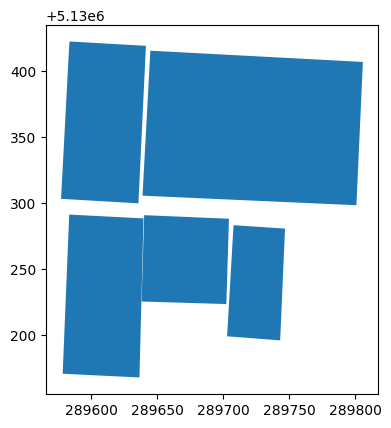

In [ ]:
lotes.plot()

In [ ]:
area_foliar_list = []
percentual_list = []
volume_list = []
alt_list = []
mean_NDVI_SV_list = []
mean_NDVI_V_list = []
mean_NDRE_SV_list = []
mean_NDRE_V_list = []
mean_thermal_list = []
src_msk = rasterio.open('/content/AF_Mask.tif')
src_ndvi = rasterio.open('/content/NDVI.tif')
src_ndre = rasterio.open('/content/NDRE.tif')
src_temp = rasterio.open('/content/Thermal.tif')
src_chm = rasterio.open('/content/CLIP/CHM_resampled.tif')
for feat in json.loads(lotes.to_json())['features']:
  out_msk_img, _ = mask(dataset=src_msk, shapes=[feat['geometry']], crop=True, nodata=-9999)

  valid_values = out_msk_img[out_msk_img != -9999]
  area_foliar = valid_values.sum() * src_msk.res[0] * src_msk.res[1]
  area_foliar_list.append(area_foliar)
  area_total = len(valid_values) * src_msk.res[0] * src_msk.res[1]
  percent = (area_foliar*100) / area_total
  percentual_list.append(percent)

  out_ndvi_img, _ = mask(dataset=src_ndvi, shapes=[feat['geometry']], crop=True, nodata=-9999)
  valid_ndvi_sv = out_ndvi_img[out_ndvi_img != -9999]
  valid_ndvi = out_ndvi_img[out_msk_img == 1]
  mean_NDVI_SV = valid_ndvi_sv.mean()
  mean_NDVI_V = valid_ndvi.mean()
  mean_NDVI_SV_list.append(mean_NDVI_SV)
  mean_NDVI_V_list.append(mean_NDVI_V)


  out_ndre_img, _ = mask(dataset=src_ndre, shapes=[feat['geometry']], crop=True, nodata=-9999)
  valid_ndre_sv = out_ndre_img[out_ndre_img != -9999]
  valid_ndre = out_ndre_img[out_msk_img == 1]
  mean_NDRE_SV = valid_ndre_sv.mean()
  mean_NDRE_V = valid_ndre.mean()
  mean_NDRE_SV_list.append(mean_NDRE_SV)
  mean_NDRE_V_list.append(mean_NDRE_V)


  out_thermal_img, _ = mask(dataset=src_ndre, shapes=[feat['geometry']], crop=True, nodata=-9999)
  valid_thermal = out_thermal_img[out_msk_img == 1]
  mean_thermal = valid_thermal.mean()
  mean_thermal_list.append(mean_thermal)





  out_chm_img, _ = mask(dataset=src_chm, shapes=[feat['geometry']], crop=True, nodata=-9999)

  if out_chm_img.shape[1] > out_msk_img.shape[1]:
      diff = (out_chm_img.shape[1] - out_msk_img.shape[1])
      out_chm_img = out_chm_img[:,diff:,:]

  if out_chm_img.shape[1] < out_msk_img.shape[1]:
      diff = (out_msk_img.shape[1] - out_chm_img.shape[1])
      out_msk_img = out_msk_img[:,diff:,:]


  if out_chm_img.shape[2] > out_msk_img.shape[2]:
      diff = (out_chm_img.shape[2] - out_msk_img.shape[2])
      out_chm_img = out_chm_img[:,:,diff:]

  if out_chm_img.shape[2] < out_msk_img.shape[2]:
      diff = (out_msk_img.shape[2] - out_chm_img.shape[2])
      out_msk_img = out_msk_img[:,:,diff:]



  valid_chm = out_chm_img[out_msk_img == 1]
  volume = valid_chm.sum() * src_chm.res[0] * src_chm.res[1]
  alt_med = valid_chm.mean()
  volume_list.append(volume)
  alt_list.append(alt_med)


(1, 2327, 1155)
(1, 2327, 1154)
(1, 2312, 1212)
(1, 2311, 1212)
(1, 2207, 3147)
(1, 2207, 3146)
(1, 1270, 1249)
(1, 1270, 1248)
(1, 1645, 827)
(1, 1645, 828)


In [ ]:
data = np.stack((area_foliar_list,percentual_list,volume_list,alt_list,mean_NDVI_SV_list,mean_NDVI_V_list,mean_NDRE_SV_list,mean_NDRE_V_list,mean_thermal_list)).transpose()

In [ ]:
pd.DataFrame(data=data,columns=['Area Foliar Metro', 'Area Foliar Pct', 'Volume', 'Altura Media', 'NDVI Veg+Solo', 'NDVI Veg','NDRE Veg+Solo', 'NDRE Veg', 'Temperatura Media'])

,Area Foliar Metro,Area Foliar Pct,Volume,Altura Media,NDVI Veg+Solo,NDVI Veg,NDRE Veg+Solo,NDRE Veg,Temperatura Media
0,5742.829472,83.133819,19357.043660,3.368532,NaN,0.780671,NaN,0.319304,0.319304
1,4768.077120,68.389812,16793.940417,3.519953,NaN,0.808526,NaN,0.317600,0.317600
2,120.611085,0.682224,158.653812,1.314592,0.313454,0.610534,0.130696,0.254227,0.254227
3,127.360507,3.046708,165.002557,1.294743,0.243746,0.770871,0.085527,0.298299,0.298299
4,1479.858081,44.097253,3410.521749,2.303182,0.771705,0.794751,0.367830,0.386470,0.386470
